In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
%qtconsole

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
from src.parameters import ANIMALS, SAMPLING_FREQUENCY, USE_LIKELIHOODS, BRAIN_AREAS

epoch_key = ('bon', 3, 2)

In [4]:
import itertools
from src.load_data import load_data

speed_metric='linear_speed'

data_types = set(itertools.chain(*USE_LIKELIHOODS.values()))
data = load_data(epoch_key, ANIMALS, SAMPLING_FREQUENCY,
                 BRAIN_AREAS, speed_metric)

INFO:src.load_data:Loading Data...
INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=1,
           time_window_duration=0.02, time_window_step=0.02,
           detrend_type='constant', start_time=3729.0257, n_tapers=1)
INFO:src.load_data:Finding multiunit high synchrony events...
INFO:src.load_data:Finding ripple times...


In [5]:
from replay_identification import ReplayDetector

position_metric = 'linear_position2'

replay_detector = ReplayDetector(spike_model_knot_spacing=10, place_bin_size=2.0, replay_speed=200,
                                 replay_state_transition_penalty=1e-5)
replay_detector.fit(
    is_replay=data['is_ripple'], speed=data['position_info'][speed_metric],
    position=data['position_info'][position_metric], spikes=data['spikes'])

INFO:replay_identification.decoders:Fitting speed model...
INFO:replay_identification.decoders:Fitting spiking model...


INFO:replay_identification.decoders:Fitting movement state transition...
INFO:replay_identification.decoders:Fitting replay state transition...


ReplayDetector(is_track_interior=None,
        lfp_model=<class 'sklearn.mixture.bayesian_mixture.BayesianGaussianMixture'>,
        lfp_model_kwargs={'n_components': 10, 'max_iter': 200, 'tol': 1e-06},
        movement_state_transition_type='empirical', movement_std=0.05,
        multiunit_density_model=<class 'sklearn.mixture.bayesian_mixture.BayesianGaussianMixture'>,
        multiunit_model_kwargs={'n_components': 30, 'max_iter': 200, 'tol': 1e-06},
        multiunit_occupancy_kwargs={'bandwidth': 2},
        multiunit_occupancy_model=<class 'sklearn.neighbors.kde.KernelDensity'>,
        n_place_bins=None, place_bin_size=2.0, replay_speed=200,
        replay_state_transition_penalty=1e-05, speed_knots=None,
        speed_threshold=4.0, spike_model_knot_spacing=10,
        spike_model_penalty=0.1)

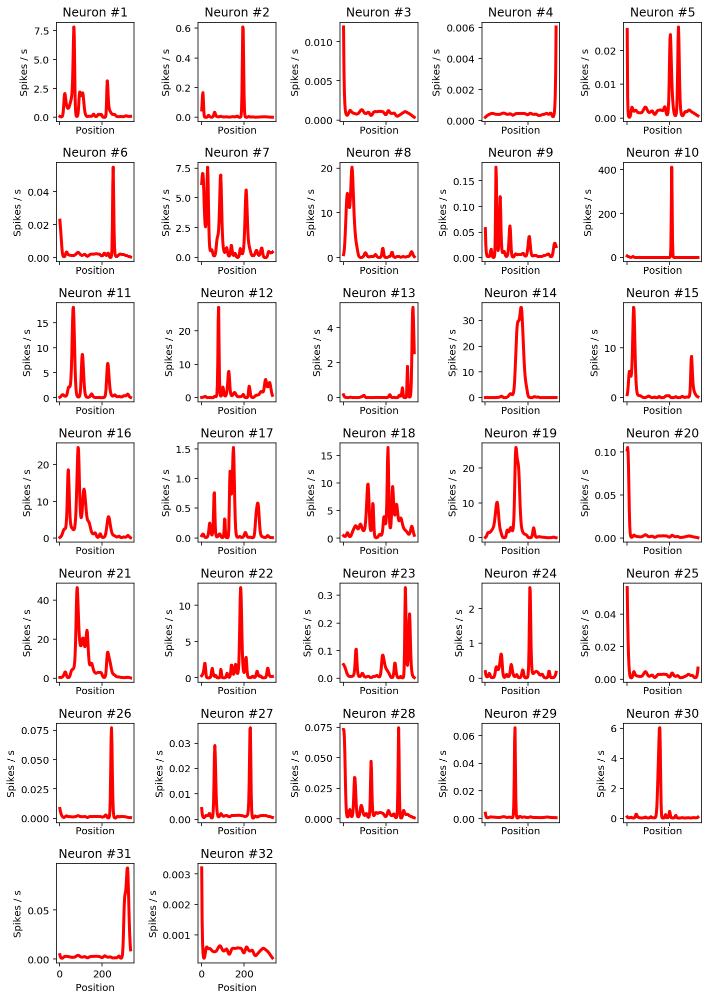

In [6]:
replay_detector.plot_fitted_place_fields(sampling_frequency=1500)

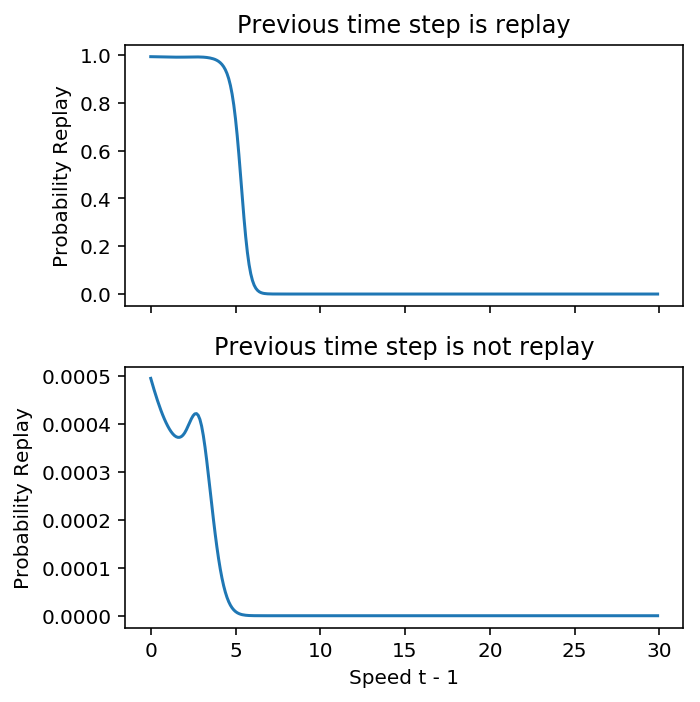

In [7]:
replay_detector.plot_replay_state_transition()

In [8]:
detector_results = replay_detector.predict(
    speed=data['position_info'][speed_metric],
    position=data['position_info'][position_metric],
    lfp_power=data['power'],
    spikes=data['spikes'],
    time=data['position_info'].index,
    use_likelihoods=['spikes'],
    use_smoother=True)

INFO:replay_identification.decoders:Predicting spikes likelihood...


INFO:replay_identification.decoders:Predicting replay probability and density...
INFO:replay_identification.decoders:Smoothing...


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
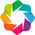

In [9]:
from src.summarize_replay import (add_epoch_info_to_dataframe, compare_overlap,
                                  decode_replays, get_replay_times,
                                  summarize_replays)

spikes_replay_info, spikes_is_replay = get_replay_times(detector_results)

In [10]:
import seaborn as sns
sns.set_context("talk", font_scale=1.05)

In [11]:
from src.visualization import plot_replay_with_data
from ipywidgets import interact

@interact(replay_number=(data['ripple_times'].index[0], data['ripple_times'].index[-1]))
def interactive(replay_number=129):
    plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                          replay_detector, spikes_detector_results=detector_results,
                          show_data_types=['spikes', 'lfps'],
                          show_result_types=['ad_hoc_ripple', 'spikes'],
                          position_metric=position_metric);

interactive(children=(IntSlider(value=129, description='replay_number', max=359, min=1), Output()), _dom_class…

In [12]:
from src.visualization import plot_replay_with_data
from ipywidgets import interact

@interact(replay_number=(spikes_replay_info.index[0], spikes_replay_info.index[-1]))
def interactive(replay_number=265):
    plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                          replay_detector, spikes_detector_results=detector_results,
                          show_data_types=['spikes', 'lfps'],
                          show_result_types=['ad_hoc_ripple', 'spikes'],
                          position_metric=position_metric);

interactive(children=(IntSlider(value=265, description='replay_number', max=385, min=1), Output()), _dom_class…

In [13]:
from src.visualization import plot_replay_with_data
from ipywidgets import interact

@interact(replay_number=(spikes_replay_info.index[0], spikes_replay_info.index[-1]))
def interactive(replay_number=54):
    plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                          replay_detector, spikes_detector_results=detector_results,
                          show_data_types=['spikes', 'lfps', 'bandpassed_lfps', 'speed'],
                          show_result_types=['ad_hoc_ripple', 'spikes'],
                          position_metric=position_metric);

interactive(children=(IntSlider(value=54, description='replay_number', max=385, min=1), Output()), _dom_classe…

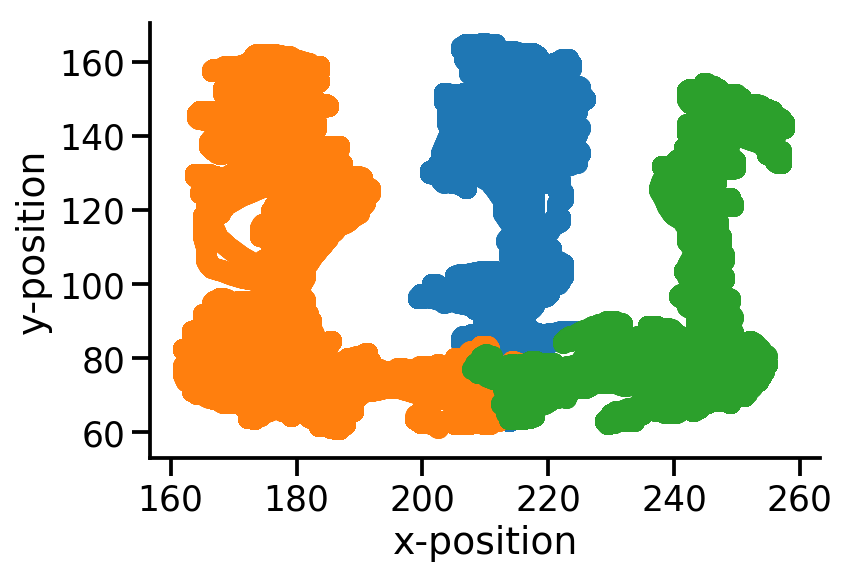

In [14]:
import seaborn as sns


for arm_name, info in data['position_info'].groupby('arm_name'):
    plt.scatter(info.x_position, info.y_position, label=arm_name)

plt.xlabel('x-position')
plt.ylabel('y-position')
sns.despine()

### Relative to detected ripples

#### Traditional Replay 

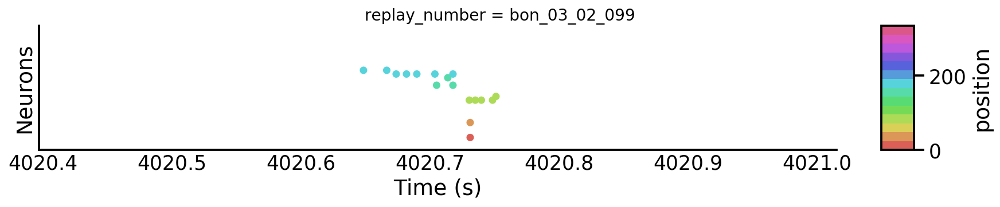

In [15]:
replay_number = 99

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=[],
                      position_metric=position_metric);

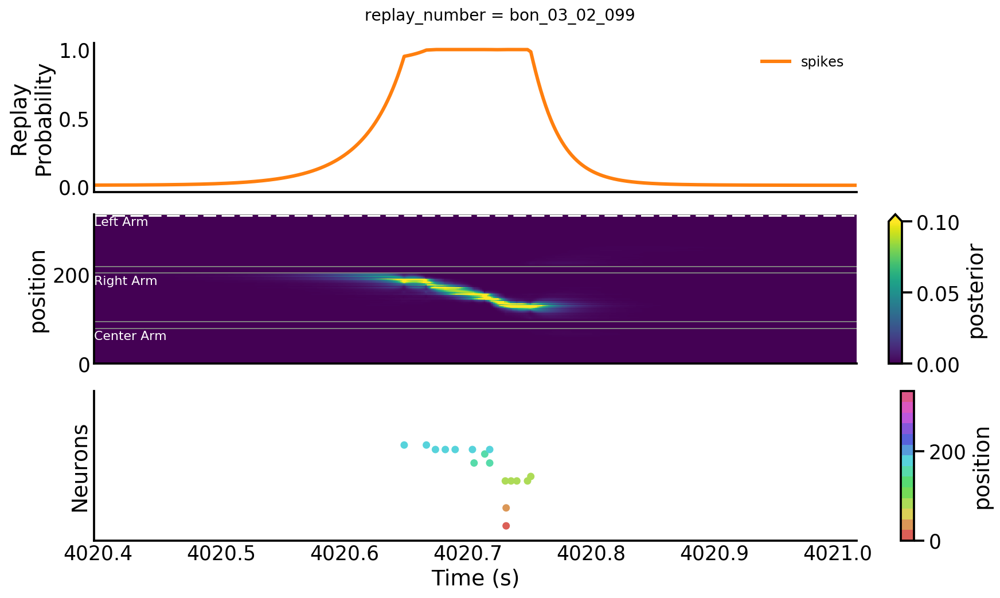

In [16]:
replay_number = 99

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['spikes'],
                      position_metric=position_metric);

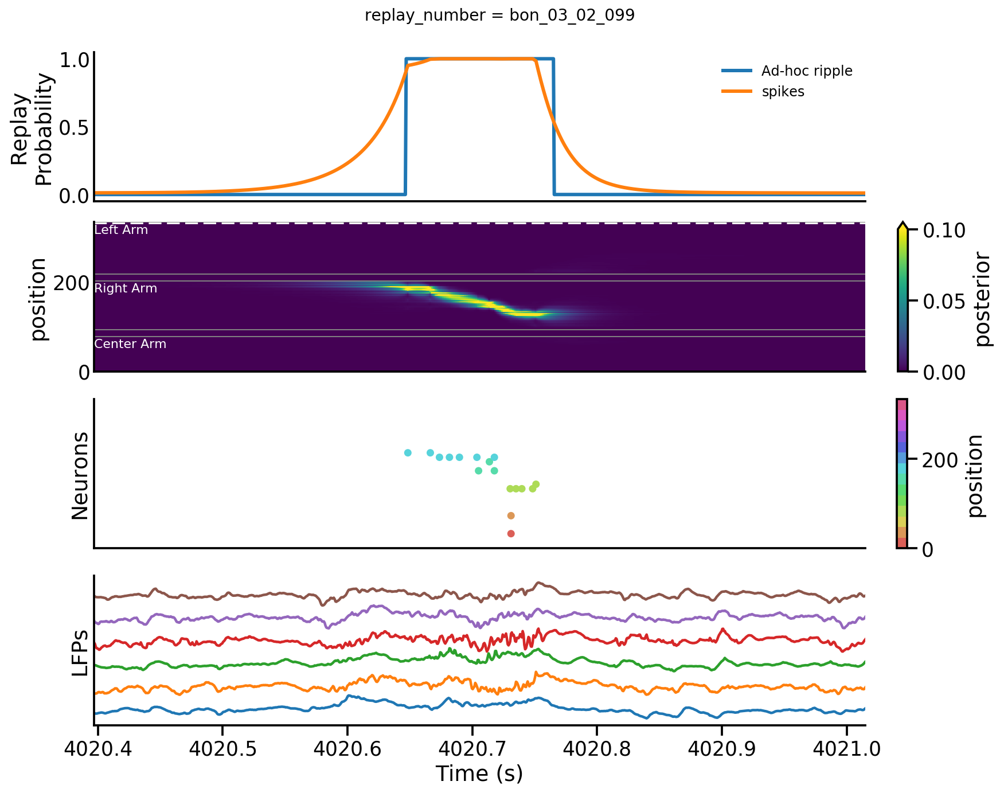

In [17]:
replay_number = 99

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes', 'lfps'],
                      show_result_types=['spikes', 'ad_hoc_ripple'],
                      position_metric=position_metric);

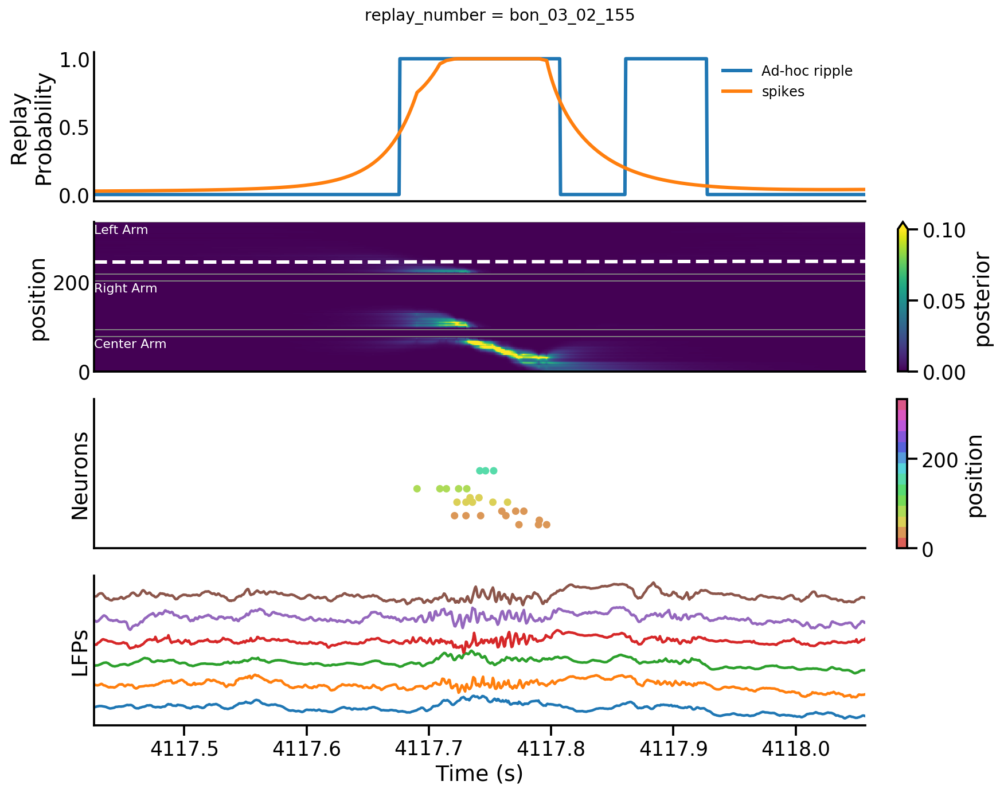

In [18]:
replay_number = 155

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes', 'lfps'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

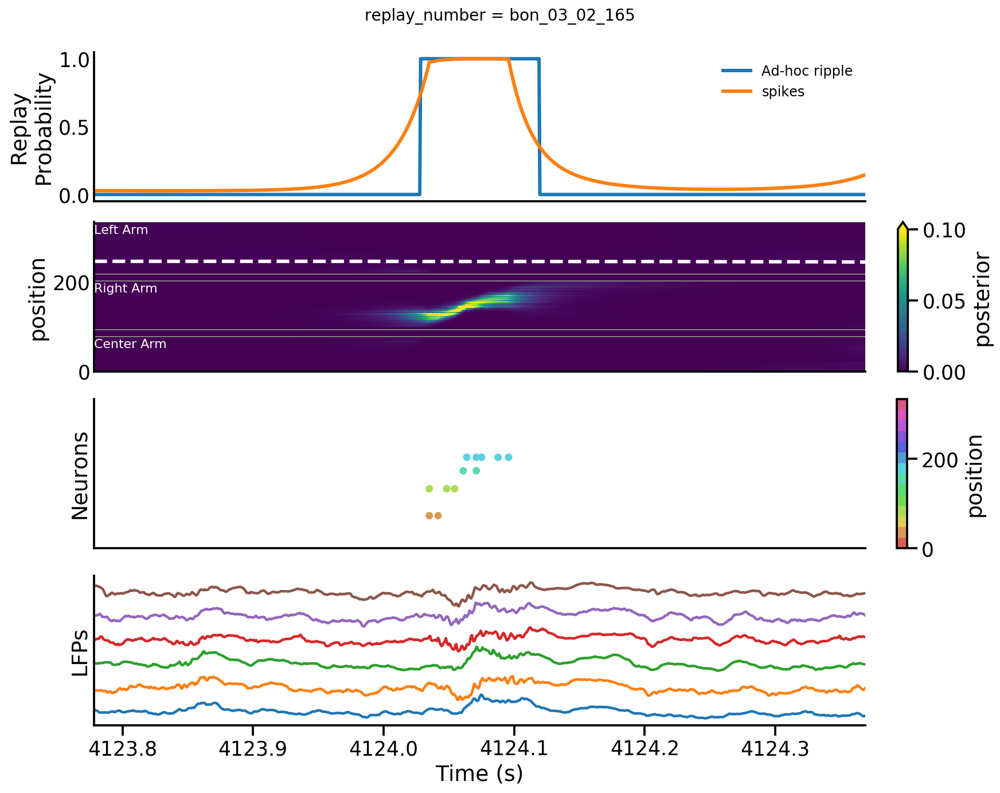

In [19]:
replay_number = 165

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes', 'lfps'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

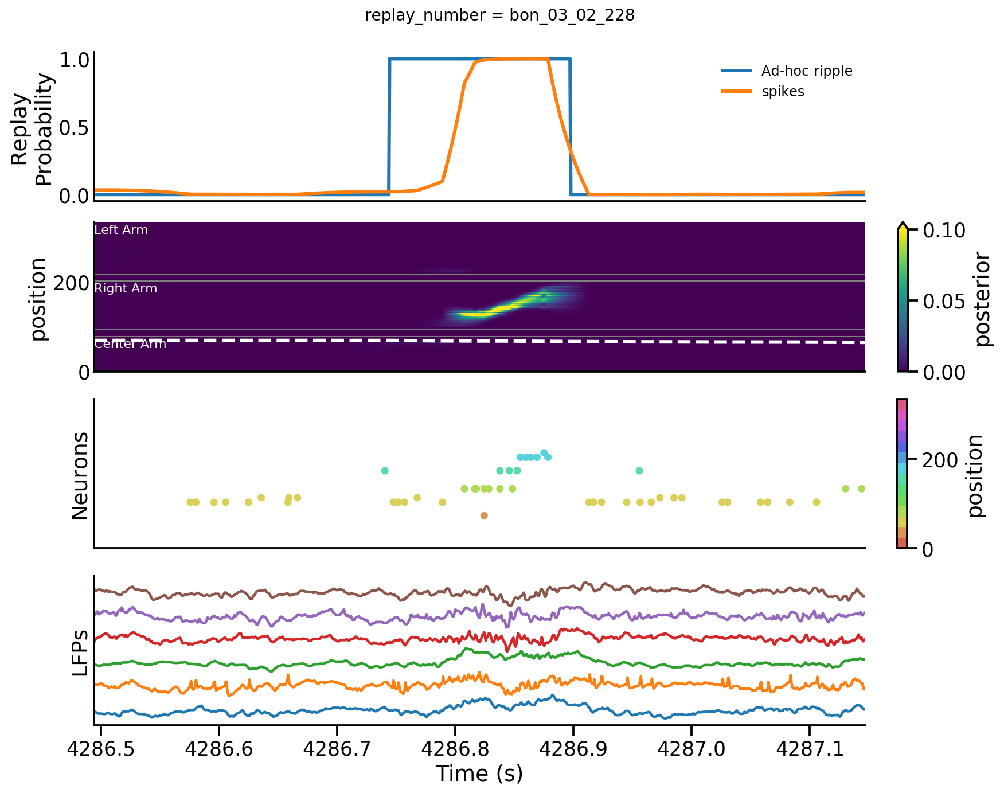

In [20]:
replay_number = 228

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes', 'lfps'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

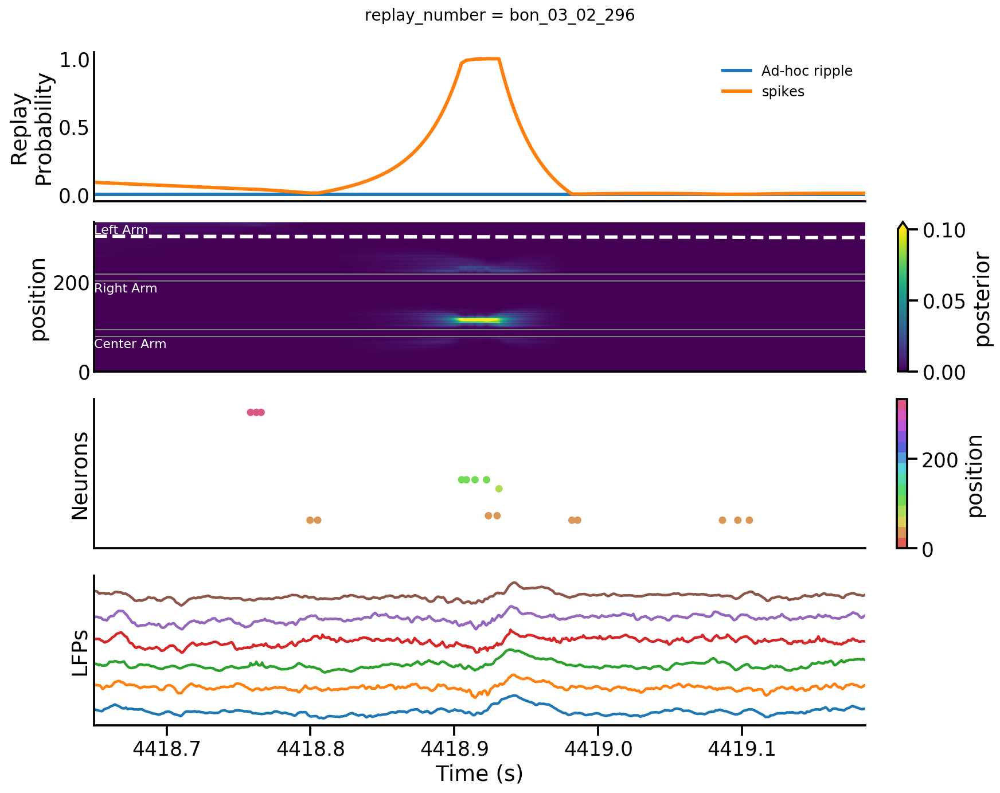

In [21]:
replay_number = 296

plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes', 'lfps'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

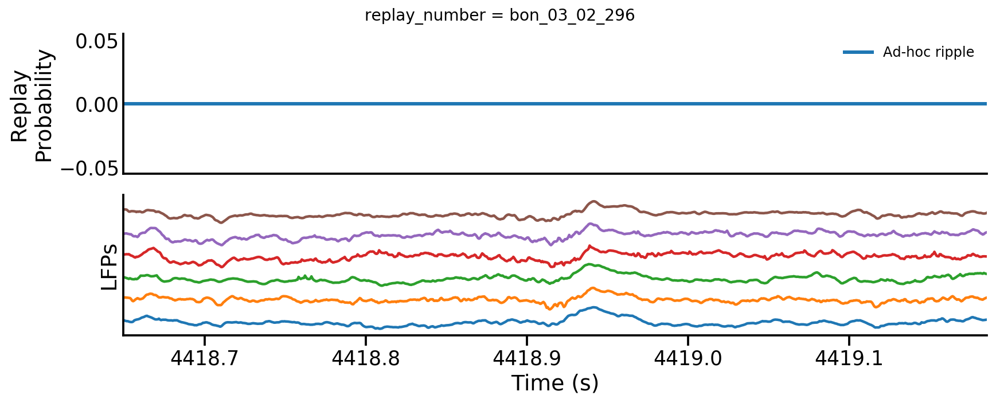

In [22]:
replay_number = 296

plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps'],
                      show_result_types=['ad_hoc_ripple',],
                      position_metric=position_metric);

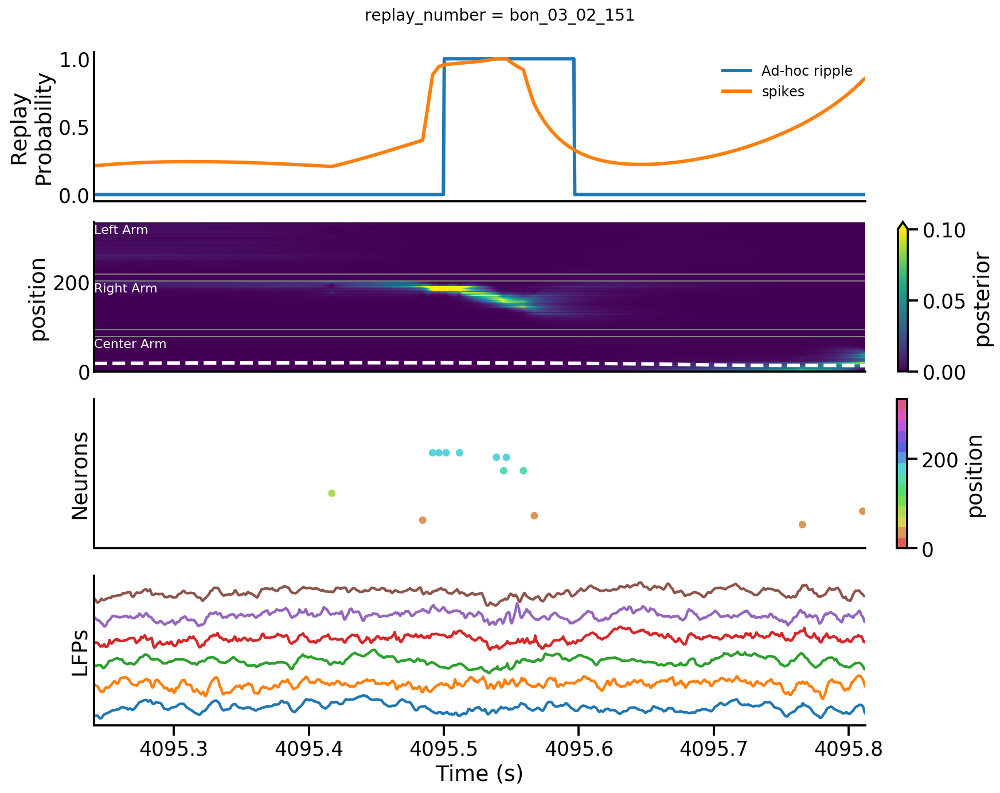

In [42]:
replay_number = 151

plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

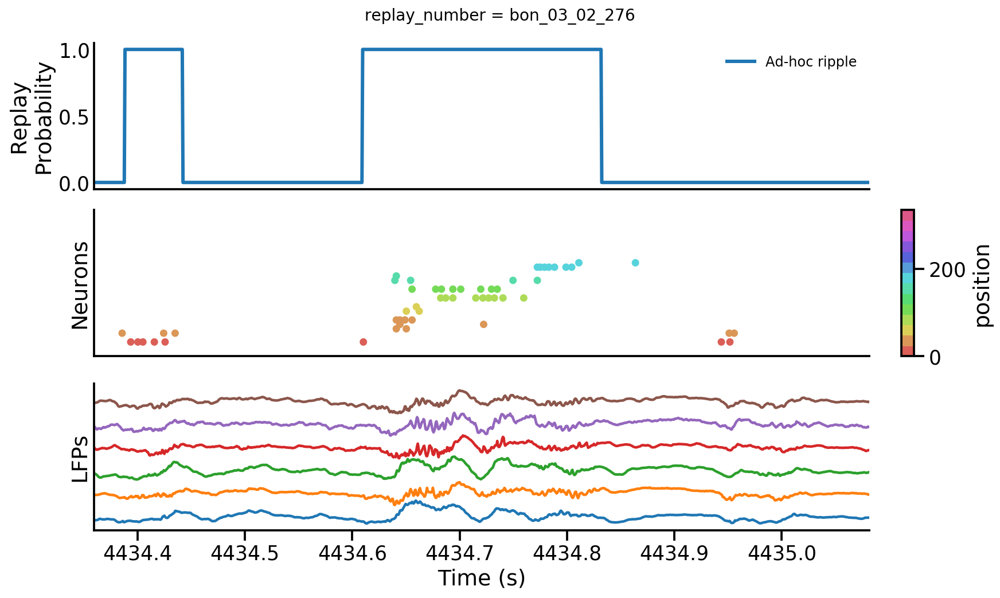

In [23]:
replay_number = 276

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes'],
                      show_result_types=['ad_hoc_ripple'],
                      position_metric=position_metric);

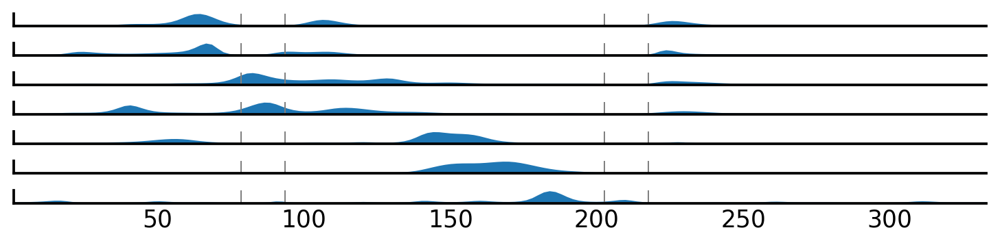

In [24]:
from src.visualization import plot_linearized_place_fields
    
replay_number = 228
offset=pd.Timedelta(0.0, 's')
replay_info = data['ripple_times'].copy()
start_time = replay_info.loc[replay_number].start_time - offset
end_time = replay_info.loc[replay_number].end_time + offset
spikes = data['spikes'].loc[start_time:end_time]

neuron_id = np.nonzero(spikes.values)[1]
sort_order = neuron_id[np.sort(np.unique(neuron_id, return_index=True)[1])]

plot_linearized_place_fields(replay_detector, data['position_info'], sort_order=sort_order);

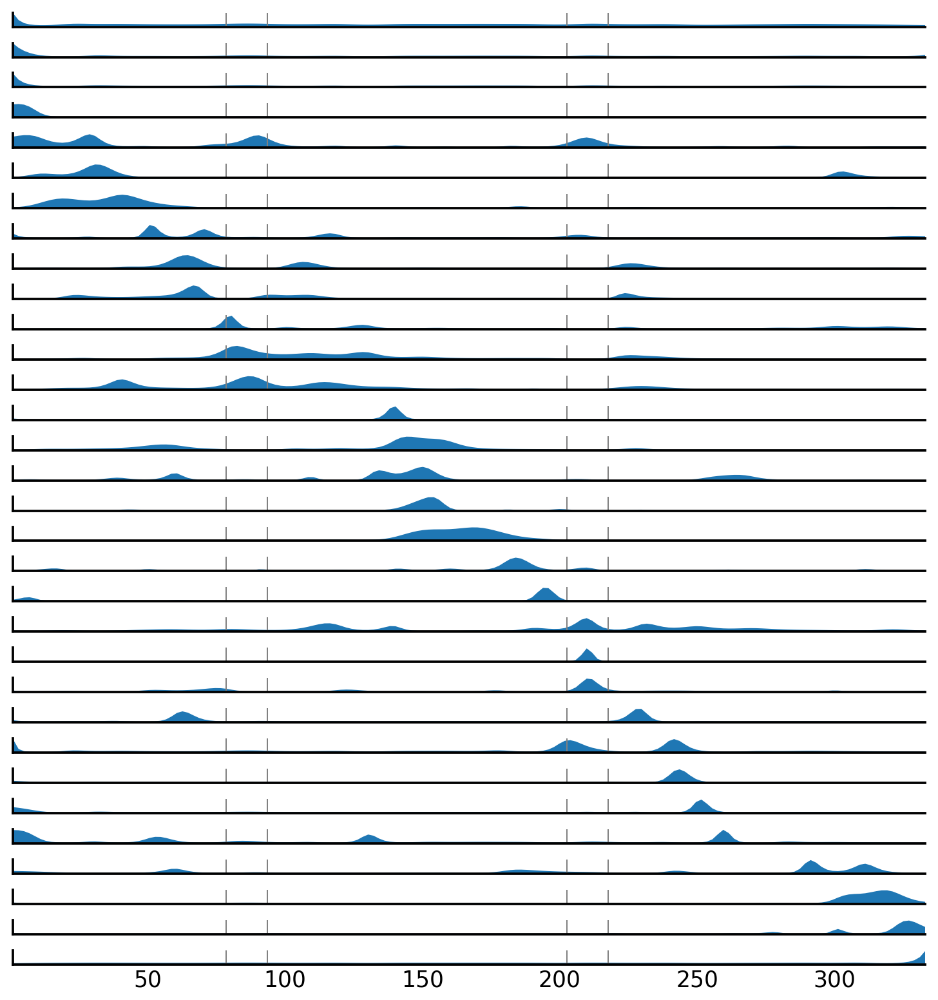

In [25]:
plot_linearized_place_fields(replay_detector, data['position_info']);

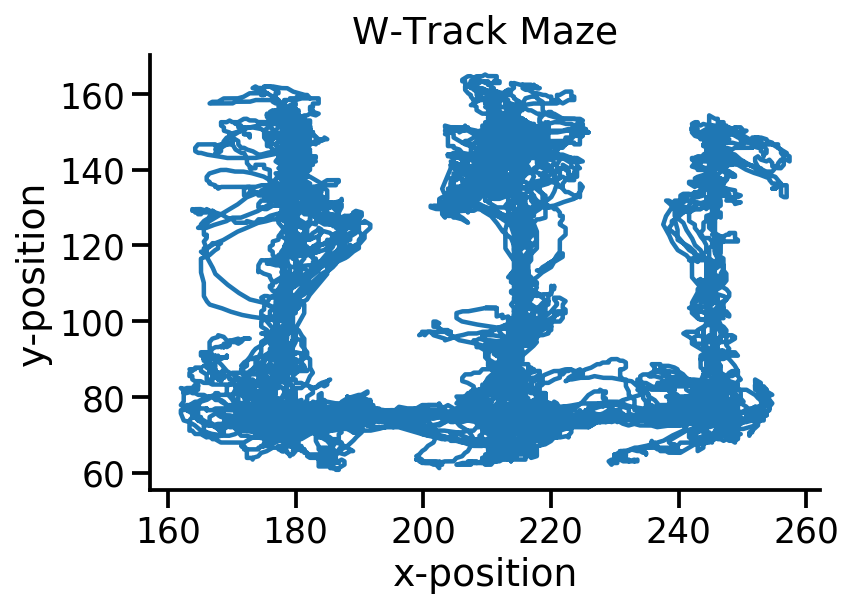

In [26]:
plt.plot(data['position_info'].x_position, data['position_info'].y_position)
plt.title('W-Track Maze')
plt.xlabel('x-position')
plt.ylabel('y-position')
sns.despine()

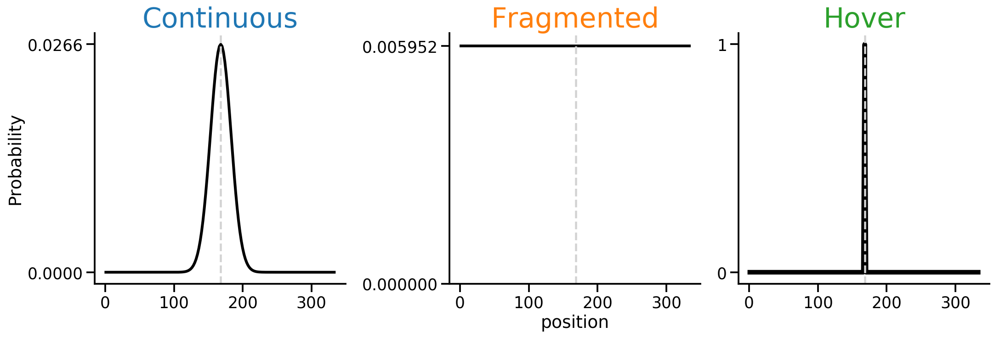

In [27]:
from scipy.stats import multivariate_normal

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, axes = plt.subplots(1, 3, constrained_layout=True,
                         figsize=(15, 5))
place_bin_centers = replay_detector.place_bin_centers_.squeeze()
n_bins = len(place_bin_centers)
cur_pos = replay_detector.place_bin_centers_[n_bins // 2]

axes[0].set_title('Continuous', fontsize=30, color=colors[0])
continuous = multivariate_normal(mean=cur_pos, cov=225
                                ).pdf(place_bin_centers)
axes[0].plot(place_bin_centers, continuous, linewidth=3, color='black')
axes[0].axvline(cur_pos, linestyle='--', color='lightgrey')
axes[0].set_yticks([0.0, continuous.max()])
axes[0].set_ylabel('Probability')

axes[1].set_title('Fragmented', fontsize=30, color=colors[1])
fragmented = np.ones_like(place_bin_centers) / n_bins
axes[1].plot(place_bin_centers, fragmented, linewidth=3, color='black')
axes[1].set_xlabel('position')
axes[1].axvline(cur_pos, linestyle='--', color='lightgrey')
axes[1].set_yticks([0.0, fragmented.max()])

axes[2].set_title('Hover', fontsize=30, color=colors[2])
stay = np.zeros_like(place_bin_centers)
stay[n_bins // 2] = 1.0
axes[2].plot(place_bin_centers, stay, linewidth=5, color='black')
axes[2].axvline(cur_pos, linestyle='--', zorder=2, label='replay position', color='lightgrey')
axes[2].set_yticks([0.0, stay.max()])

# axes[2].set_xlim((place_bin_centers.min(), place_bin_centers.max()))

sns.despine()

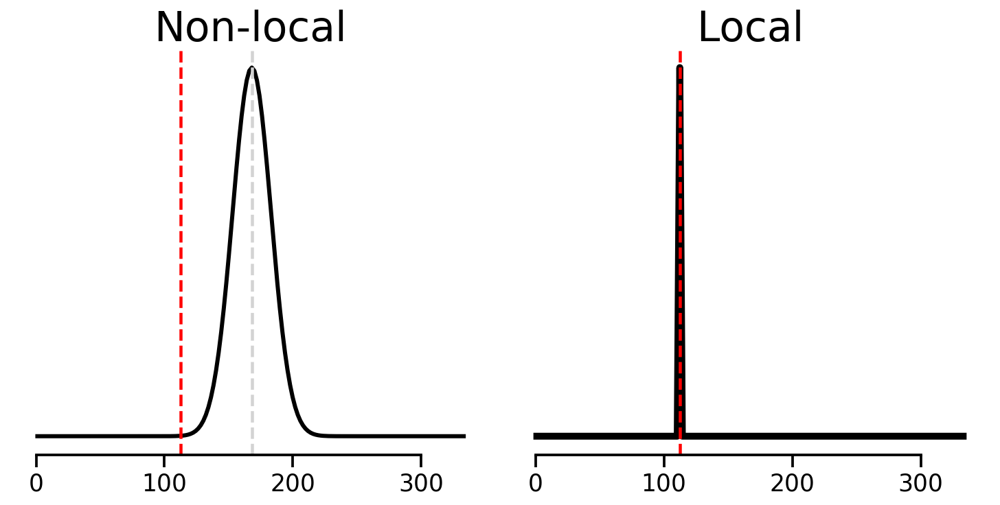

In [28]:
from scipy.stats import multivariate_normal

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, axes = plt.subplots(1, 2, constrained_layout=True,
                         sharex=True, figsize=(10, 5))
place_bin_centers = replay_detector.place_bin_centers_.squeeze()
n_bins = len(place_bin_centers)
cur_pos = replay_detector.place_bin_centers_[n_bins // 2]

axes[0].set_title('Non-local', fontsize=30)
continuous = multivariate_normal(mean=cur_pos, cov=225
                                ).pdf(place_bin_centers)
axes[0].plot(place_bin_centers, continuous, linewidth=3, color='black')
axes[0].axvline(cur_pos, linestyle='--', color='lightgrey')
axes[0].axvline(place_bin_centers[n_bins // 3], linestyle='--', zorder=2, label='animal position', color='red')
axes[0].set_yticks([])


axes[1].set_title('Local', fontsize=30)
stay = np.zeros_like(place_bin_centers)
stay[n_bins // 3] = 1.0
axes[1].plot(place_bin_centers, stay, linewidth=5, color='black')

axes[1].axvline(place_bin_centers[n_bins // 3], linestyle='--', zorder=2, label='animal position', color='red')
axes[1].set_yticks([])

# axes[2].set_xlim((place_bin_centers.min(), place_bin_centers.max()))

sns.despine(trim=True, left=True)

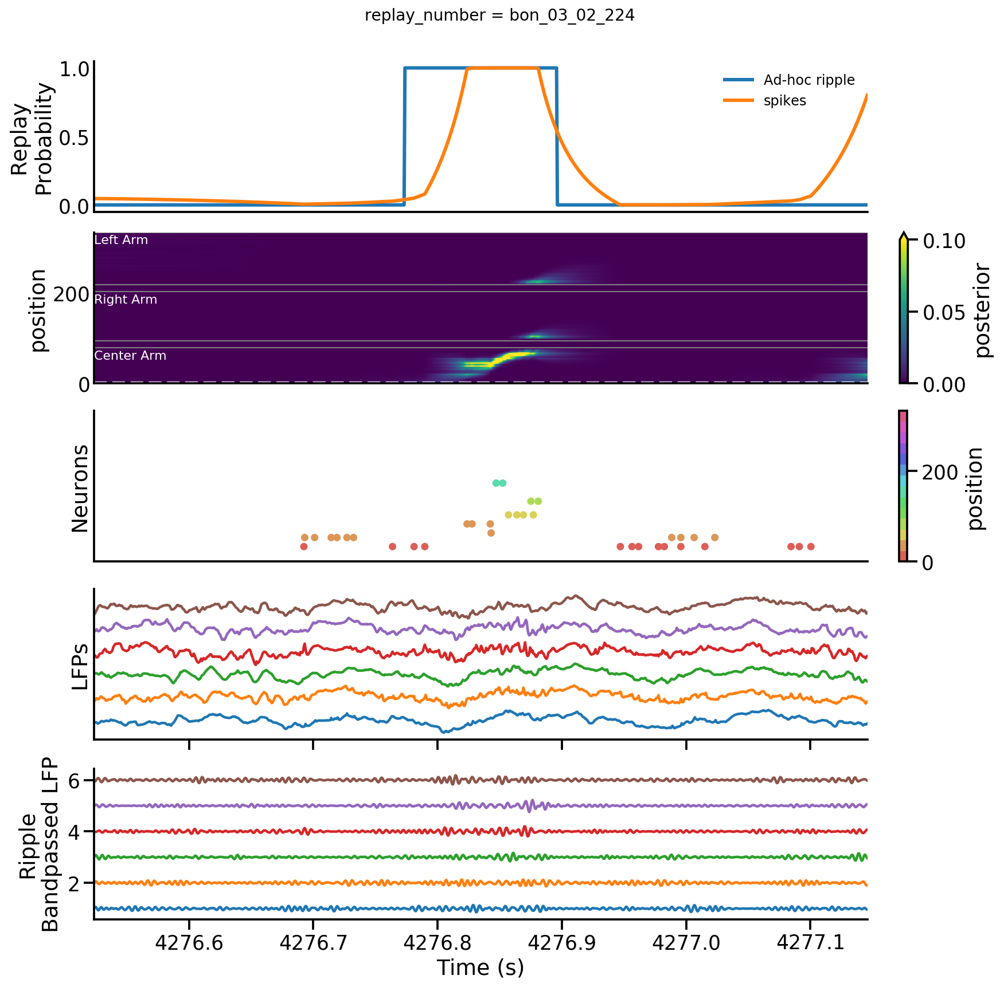

In [29]:
replay_number = 224

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes', 'bandpassed_lfps'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric);

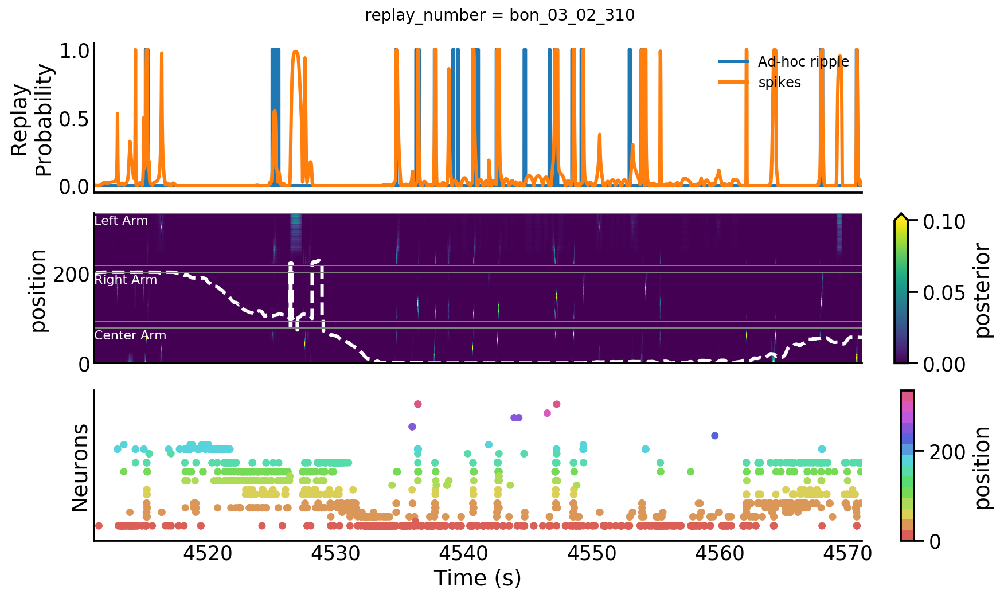

In [30]:
replay_number = 310

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

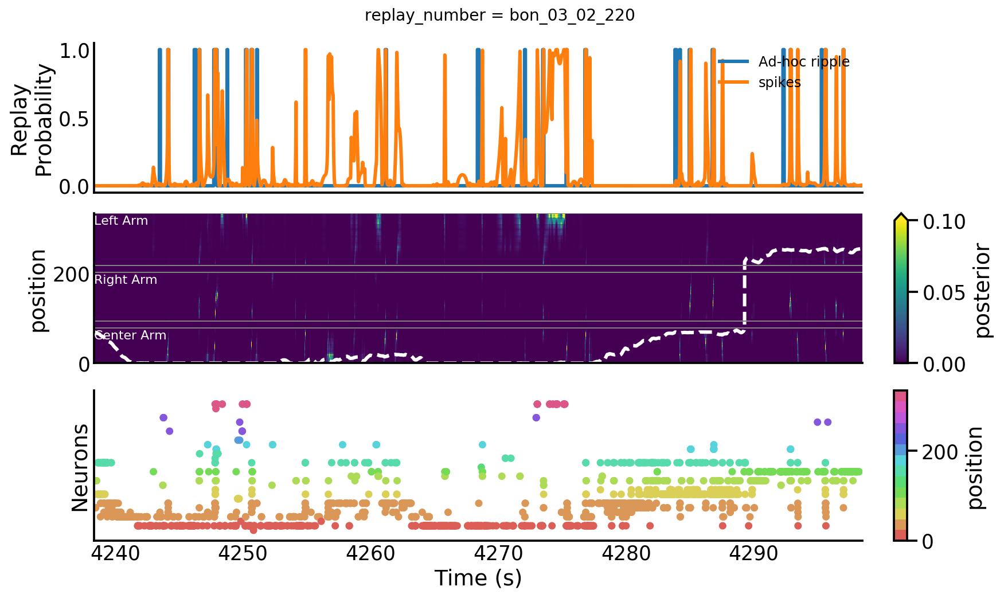

In [31]:
replay_number = 220

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

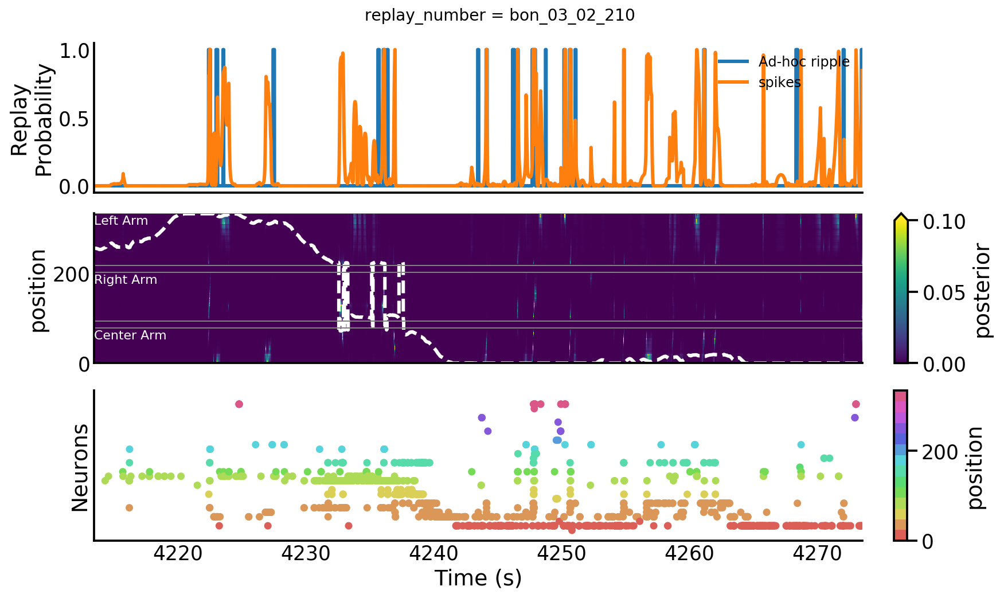

In [32]:
replay_number = 210

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

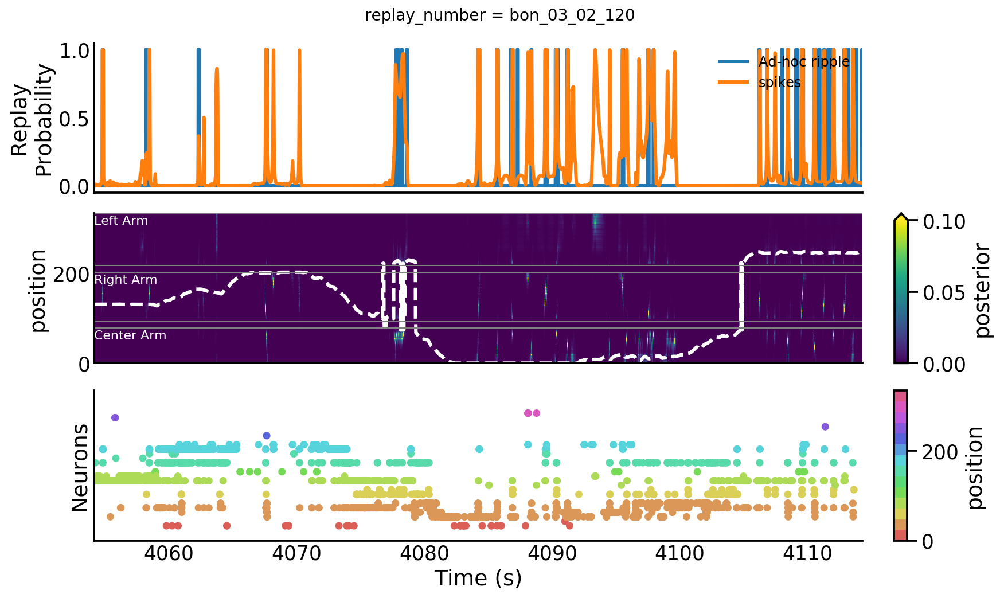

In [33]:
replay_number = 120

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

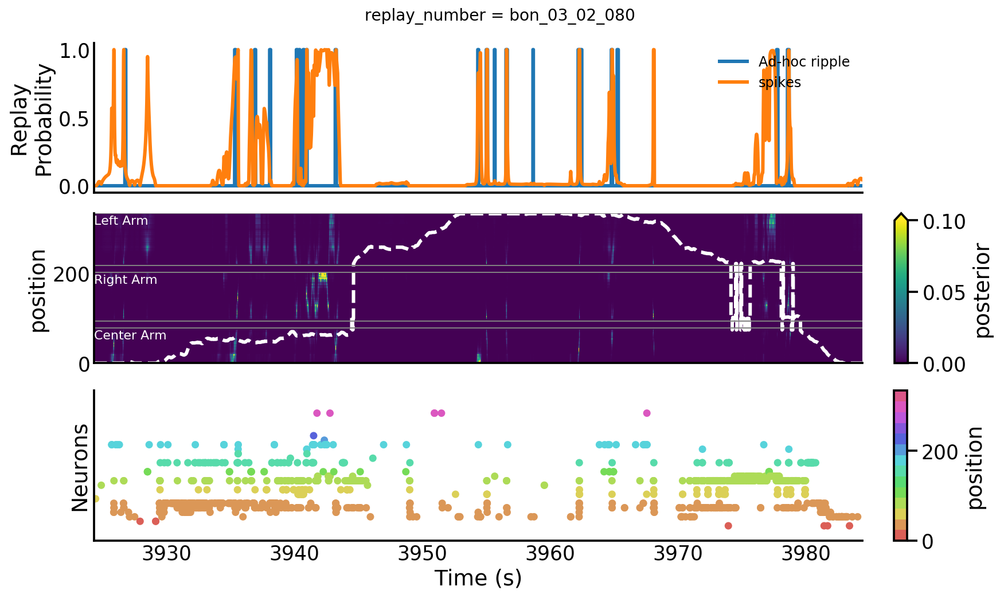

In [34]:
replay_number = 80

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

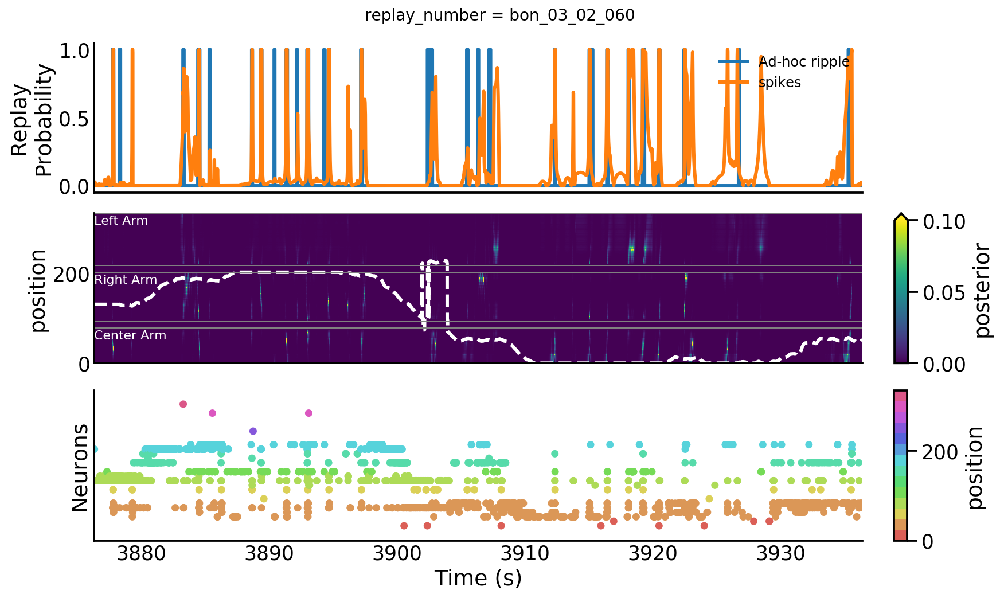

In [35]:
replay_number = 60

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

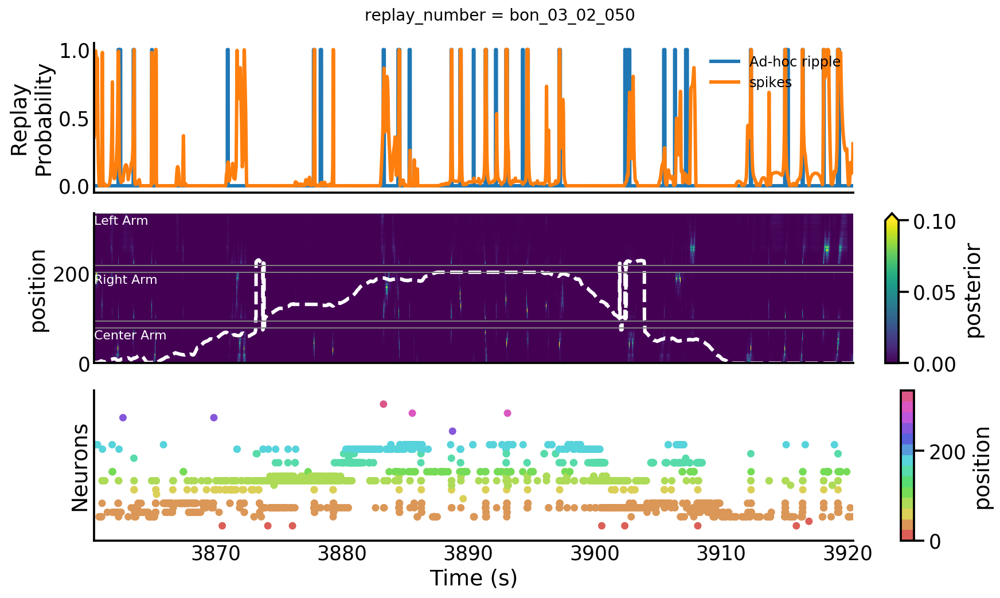

In [36]:
replay_number = 50

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

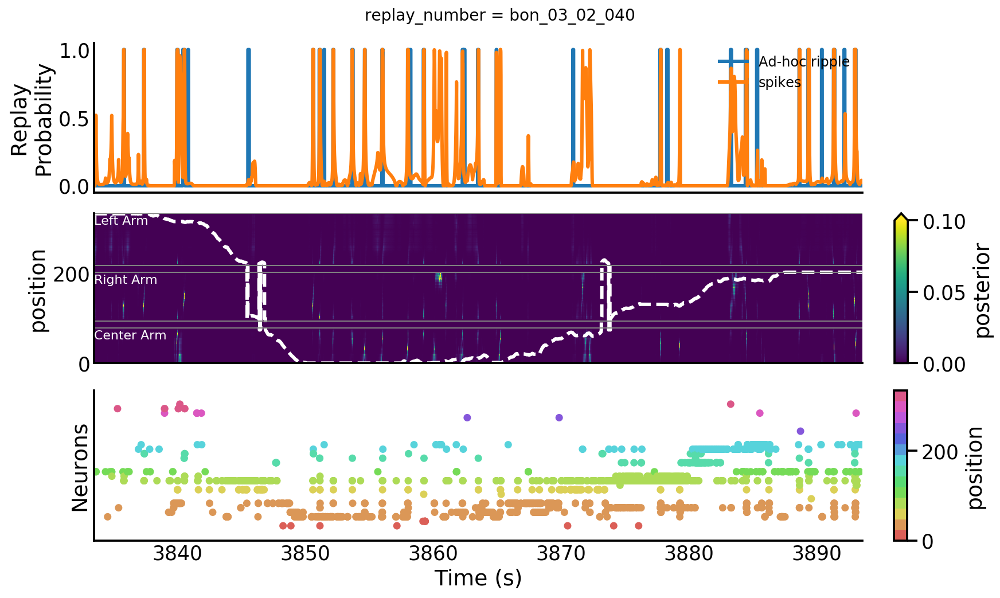

In [37]:
replay_number = 40

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

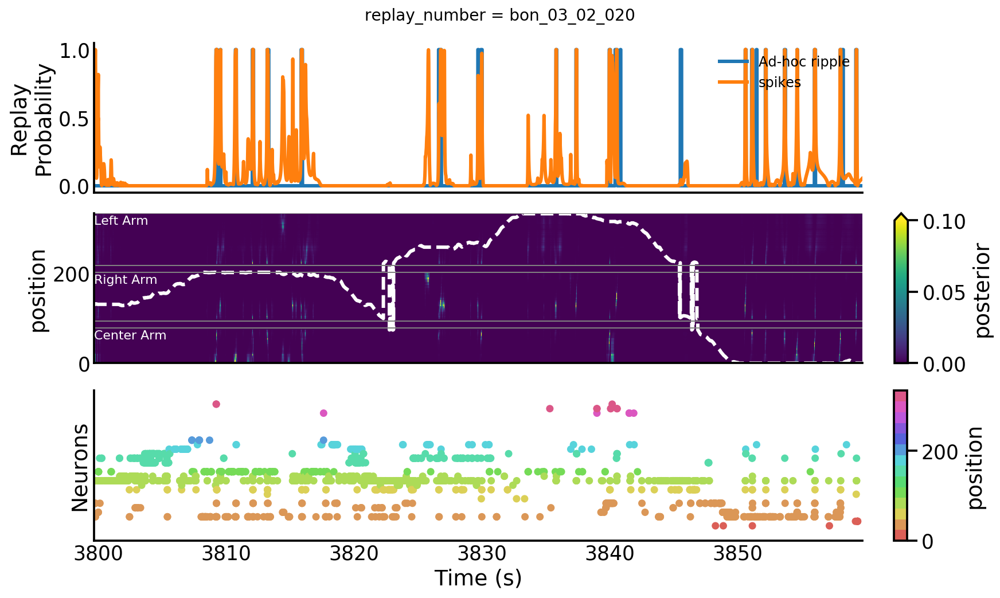

In [38]:
replay_number = 20

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

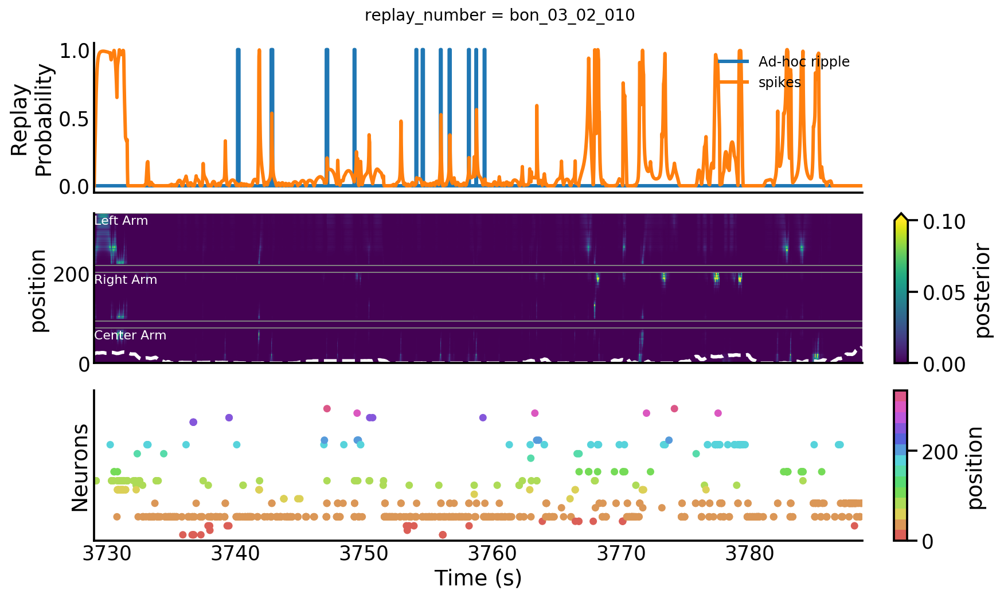

In [39]:
replay_number = 10

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

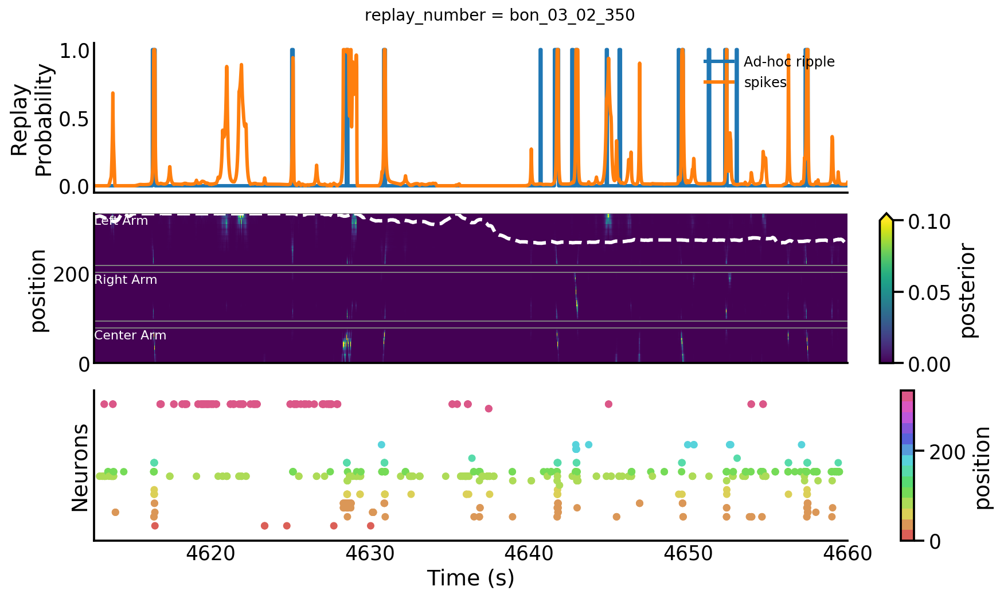

In [40]:
replay_number = 350

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(30.00, 's'));

In [43]:
detector_no_smooth_results = replay_detector.predict(
    speed=data['position_info'][speed_metric],
    position=data['position_info'][position_metric],
    lfp_power=data['power'],
    spikes=data['spikes'],
    time=data['position_info'].index,
    use_likelihoods=['spikes'],
    use_smoother=False)

INFO:replay_identification.decoders:Predicting spikes likelihood...


INFO:replay_identification.decoders:Predicting replay probability and density...


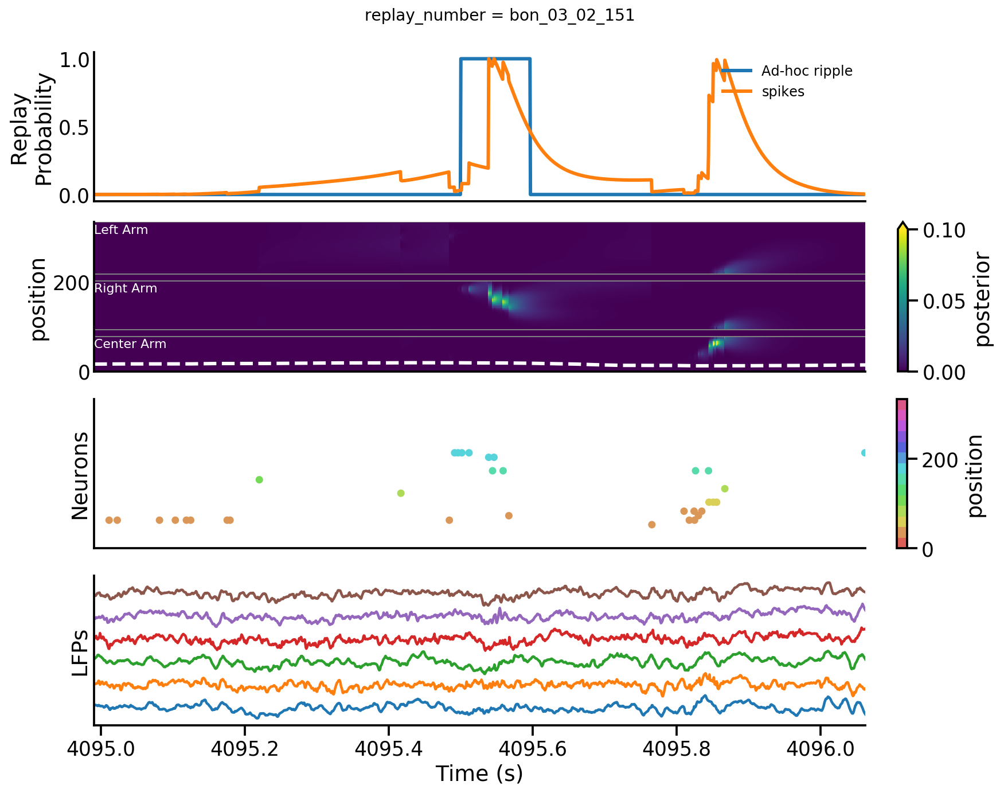

In [49]:
replay_number = 151

plot_replay_with_data(replay_number, data, spikes_replay_info, epoch_key,
                      replay_detector, spikes_detector_results=detector_no_smooth_results,
                      show_data_types=['lfps', 'spikes'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric,
                      offset=pd.Timedelta(0.500, 's'));

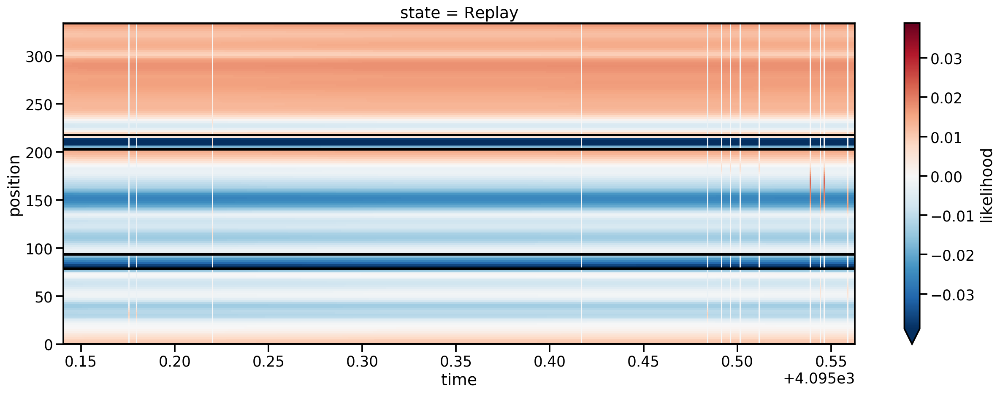

In [83]:
offset=pd.Timedelta(0.350, 's')
start_time = spikes_replay_info.loc[151].start_time - offset 
end_time = spikes_replay_info.loc[151].end_time

r = (detector_no_smooth_results
     .sel(time=slice(start_time, end_time))
     .assign(time=lambda ds: ds.time / np.timedelta64(1, 's')))
h = (r.diff('state')
     .likelihood
     .plot(x='time', y='position', robust=True, aspect=3, size=7))


position_info = data['position_info']

max_df = (position_info
          .groupby('arm_name')[position_metric].max())

for arm_name, max_position in max_df.iteritems():
    h.axes.axhline(max_position, color='black',
               linestyle='-', linewidth=3)
min_df = (position_info
          .groupby('arm_name')[position_metric].min())
for arm_name, min_position in min_df.iteritems():
    h.axes.axhline(min_position, color='black',
               linestyle='-', linewidth=3)

In [169]:
from ipywidgets import interact

offset=pd.Timedelta(0.350, 's')
start_time = spikes_replay_info.loc[151].start_time - offset 
end_time = spikes_replay_info.loc[151].start_time + offset 
n_time = len(detector_no_smooth_results.time)

@interact(time=(0, n_time))
def plot_likelihood(time=549587):
    #549290
    #549587
    #549770
    fig, axes = plt.subplots(2, 3, figsize=(15, 5), constrained_layout=True)

    (detector_no_smooth_results
     .isel(time=time)
     .sel(state='No Replay')
     .assign(time=lambda ds: ds.time / np.timedelta64(1, 's'))
     .likelihood.plot(x='position', ax=axes[0, 0]))
    axes[0, 0].set_title('No Replay')
    axes[0, 0].set_xlabel('')

    (detector_no_smooth_results
     .isel(time=time)
     .sel(state='Replay')
     .assign(time=lambda ds: ds.time / np.timedelta64(1, 's'))
     .likelihood.plot(x='position', ax=axes[0, 1]))
    axes[0, 1].set_title('Replay')
    axes[0, 1].set_xlabel('')

    (detector_no_smooth_results
     .isel(time=time)
     .sel(state='No Replay')
     .assign(time=lambda ds: ds.time / np.timedelta64(1, 's'))
     .posterior.plot(x='position', ax=axes[1, 0]))
    axes[1, 0].set_title('')

    (detector_no_smooth_results
     .isel(time=time)
     .sel(state='Replay')
     .assign(time=lambda ds: ds.time / np.timedelta64(1, 's'))
     .posterior.plot(x='position', ax=axes[1, 1]))
    axes[1, 1].set_ylim((0, 0.005))
    axes[1, 1].set_title('')
    
    (detector_no_smooth_results
     .sel(time=slice(start_time, end_time))
     .replay_probability.plot(x='time', ax=axes[0, -1]))
    axes[0, -1].axvline(
        float(detector_no_smooth_results.isel(time=time).time),
        color='black')
    
    
    sns.despine()


interactive(children=(IntSlider(value=549587, description='time', max=1396490), Output()), _dom_classes=('widg…

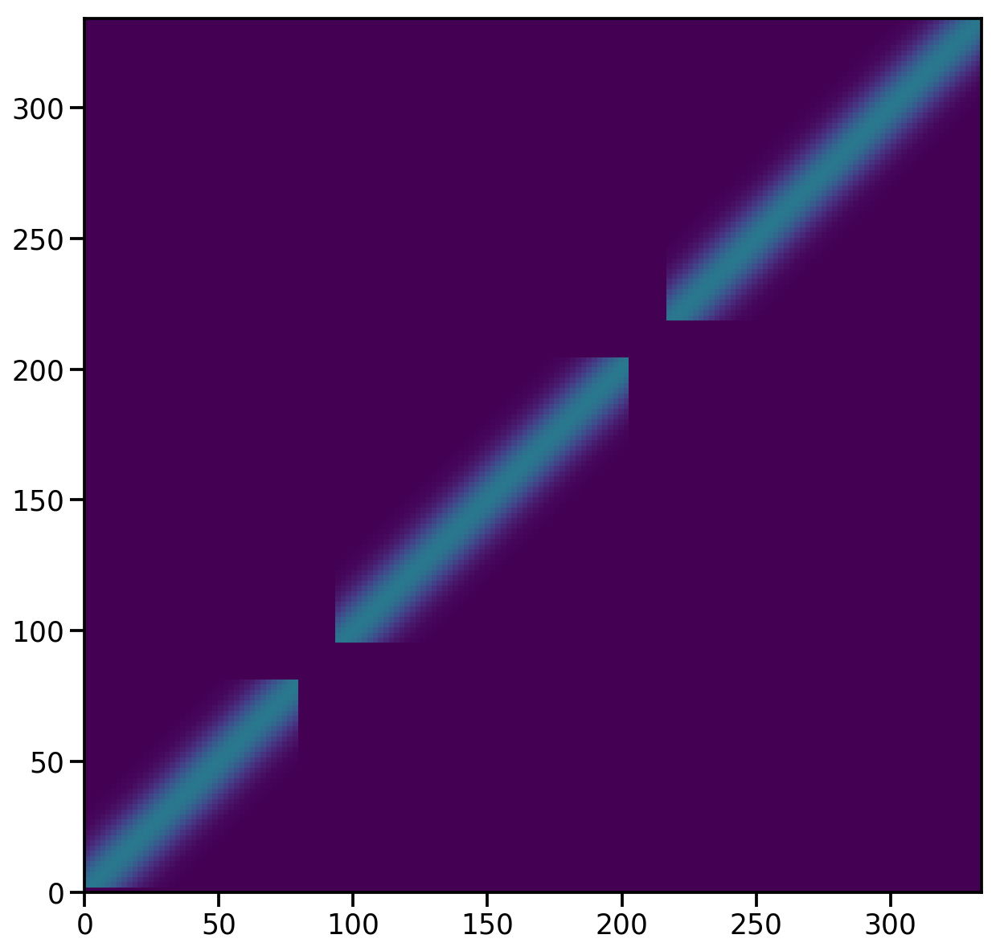

In [402]:
# fix movement state transition
from scipy.stats import multivariate_normal

position = position_info.linear_position2.values
place_bin_edges = replay_detector.place_bin_edges_.squeeze()
place_bin_centers = replay_detector.place_bin_centers_.squeeze()
labels = position_info.arm_name.values
movement_var = replay_detector.movement_std
replay_speed = 2000

bin_inds = np.digitize(position, bins=place_bin_edges) - 1
bin_labels = pd.Series(labels).groupby(bin_inds).unique().apply(lambda s: s[0])
n_bins = place_bin_edges.size - 1

st = []

for bin_ind, bin_center in enumerate(place_bin_centers.squeeze()):
    try:
        bin_label = bin_labels.loc[bin_ind]
        is_same_bin = (bin_labels == bin_label)
        gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
            place_bin_centers)
        row = np.zeros((n_bins,))
        row[is_same_bin[is_same_bin].index] = gaussian[is_same_bin[is_same_bin].index]
        
        # Deal with case where probability is on other arms
        for name, df in bin_labels.groupby(bin_labels):
            if name != bin_label:
                if (bin_label == 'Left Arm') & (name == 'Right Arm'):
                    (bin_labels == name)
        st.append(row)
    except KeyError:
        st.append(np.zeros((n_bins,)))
        
        
plt.figure(figsize=(10, 10))
plt.pcolormesh(place_bin_edges.squeeze(), place_bin_edges.squeeze(), st, vmax=0.1)

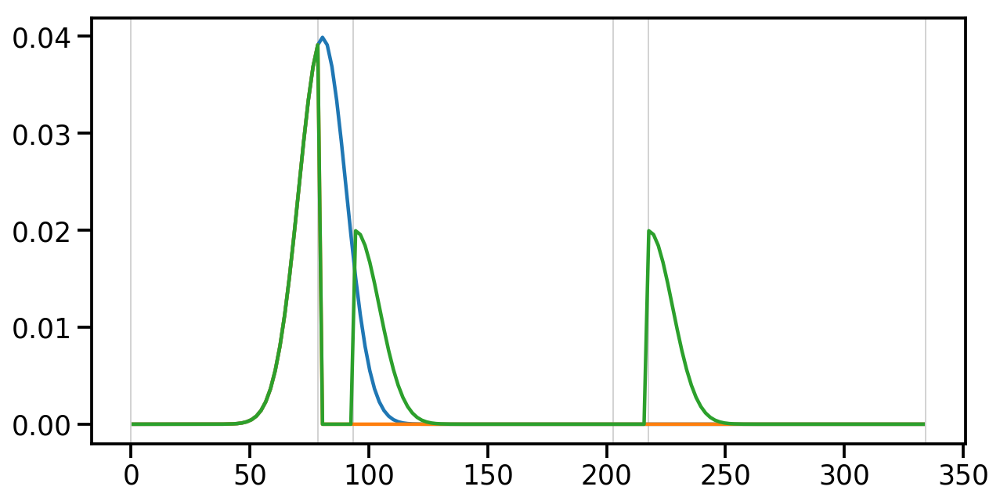

In [416]:
bin_ind = 40
bin_center = place_bin_centers.squeeze()[bin_ind]
bin_label = bin_labels.loc[bin_ind]
is_same_bin = (bin_labels == bin_label)
is_same_bin_ind = is_same_bin[is_same_bin].index
is_same_bin = np.zeros_like(place_bin_centers.squeeze(), dtype=np.bool)
is_same_bin[is_same_bin_ind] = True

gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
    place_bin_centers)
row = np.zeros((n_bins,))
row[is_same_bin] = gaussian[is_same_bin]

plt.figure(figsize=(10,5))
plt.plot(place_bin_centers, gaussian)
plt.plot(place_bin_centers, row)

for arm_name, max_position in max_df.iteritems():
    plt.axvline(max_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
min_df = (position_info
          .groupby('arm_name')[position_metric].min())
for arm_name, min_position in min_df.iteritems():
    plt.axvline(min_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
    
is_right = np.nonzero(gaussian[~is_same_bin].max() == gaussian)[0][0] >= gaussian.argmax()

arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
row[arm_ind] = gaussian[~is_same_bin][:arm_ind.size] / 2

arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
row[arm_ind] = gaussian[~is_same_bin][:arm_ind.size] / 2

plt.plot(place_bin_centers, row)

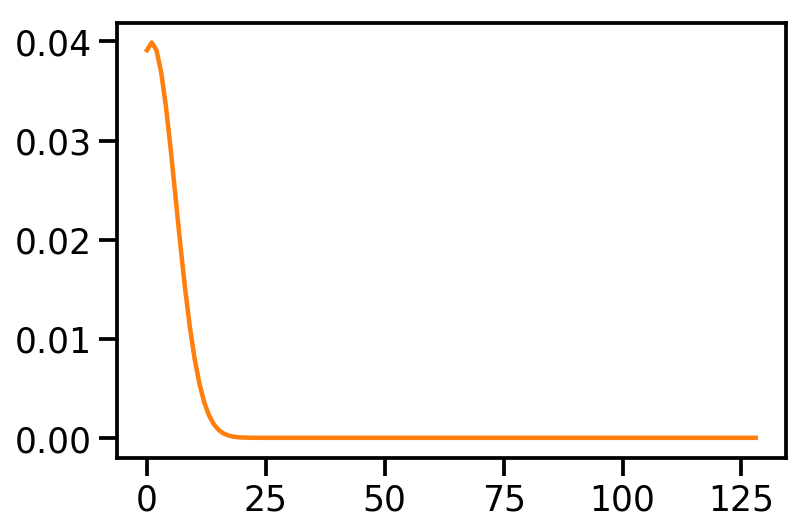

In [417]:
before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

plt.plot(before_gaussian)
plt.plot(after_gaussian)

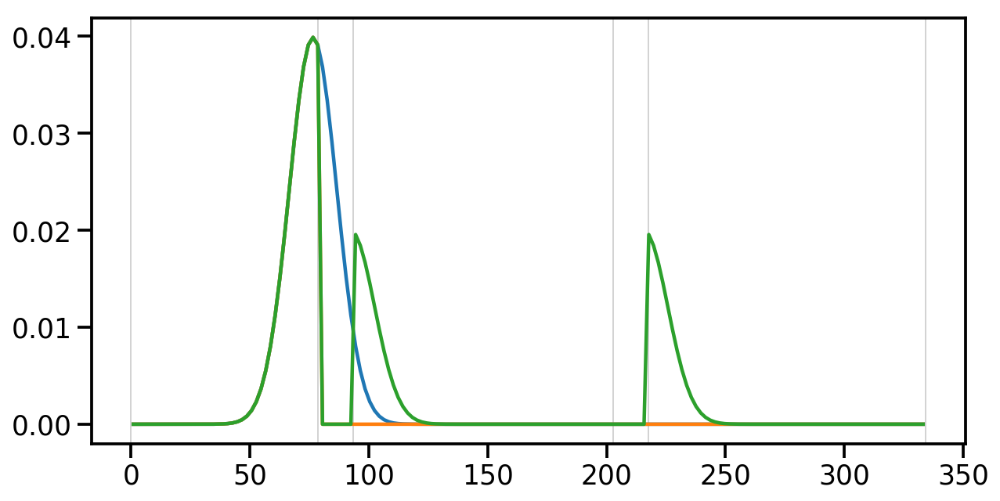

In [455]:
bin_ind = 38
bin_center = place_bin_centers.squeeze()[bin_ind]
bin_label = bin_labels.loc[bin_ind]
is_same_bin = (bin_labels == bin_label)
is_same_bin_ind = is_same_bin[is_same_bin].index
is_same_bin = np.zeros_like(place_bin_centers.squeeze(), dtype=np.bool)
is_same_bin[is_same_bin_ind] = True

gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
    place_bin_centers)
row = np.zeros((n_bins,))
row[is_same_bin] = gaussian[is_same_bin]

plt.figure(figsize=(10,5))
plt.plot(place_bin_centers, gaussian)
plt.plot(place_bin_centers, row)

for arm_name, max_position in max_df.iteritems():
    plt.axvline(max_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
min_df = (position_info
          .groupby('arm_name')[position_metric].min())
for arm_name, min_position in min_df.iteritems():
    plt.axvline(min_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
    
before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
n_samples = min(arm_ind.size, after_gaussian.size)
row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2

arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
n_samples = min(arm_ind.size, after_gaussian.size)
row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2

plt.plot(place_bin_centers, row)

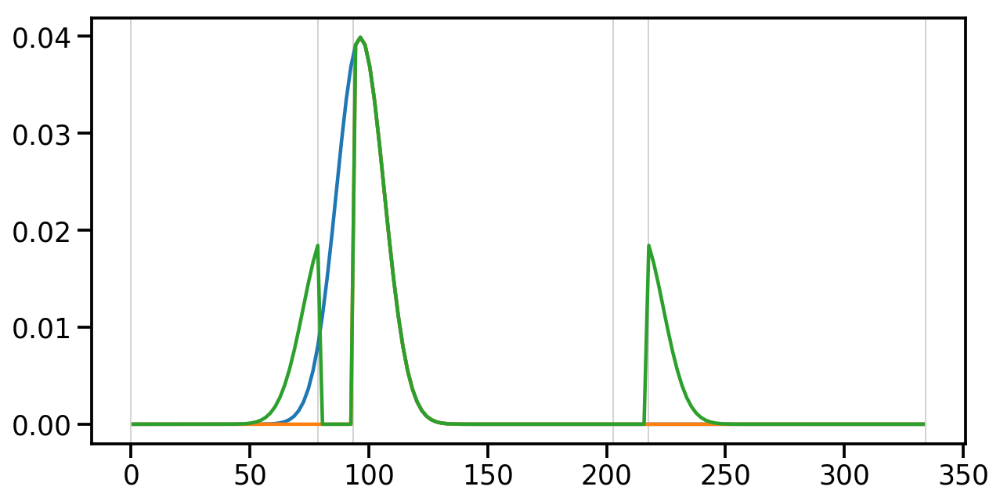

In [445]:
bin_ind = 48
bin_center = place_bin_centers.squeeze()[bin_ind]
bin_label = bin_labels.loc[bin_ind]
is_same_bin = (bin_labels == bin_label)
is_same_bin_ind = is_same_bin[is_same_bin].index
is_same_bin = np.zeros_like(place_bin_centers.squeeze(), dtype=np.bool)
is_same_bin[is_same_bin_ind] = True

gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
    place_bin_centers)
row = np.zeros((n_bins,))
row[is_same_bin] = gaussian[is_same_bin]

plt.figure(figsize=(10,5))
plt.plot(place_bin_centers, gaussian)
plt.plot(place_bin_centers, row)

for arm_name, max_position in max_df.iteritems():
    plt.axvline(max_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
min_df = (position_info
          .groupby('arm_name')[position_metric].min())
for arm_name, min_position in min_df.iteritems():
    plt.axvline(min_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
    
before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
n_samples = min(arm_ind.size, before_gaussian.size)
row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
n_samples = min(arm_ind.size, before_gaussian.size)
row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2

plt.plot(place_bin_centers, row)

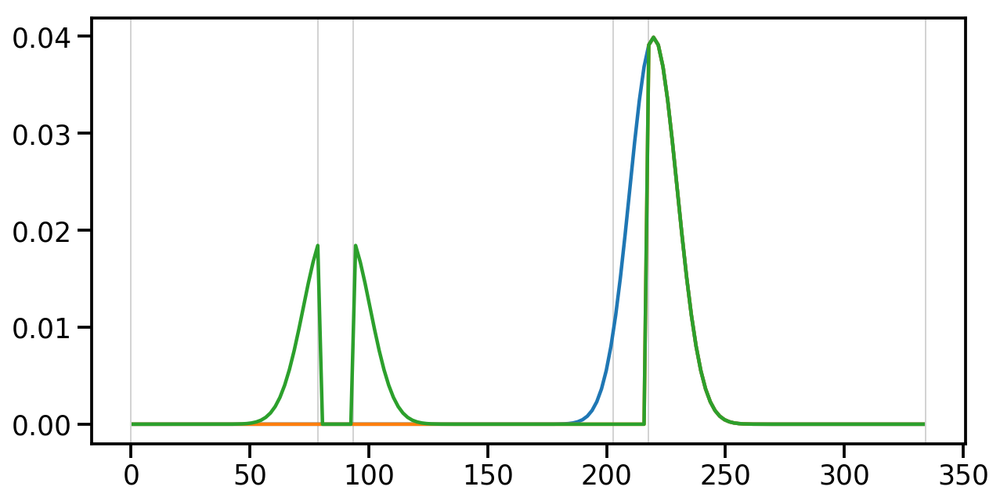

In [453]:
bin_ind = 110
bin_center = place_bin_centers.squeeze()[bin_ind]
bin_label = bin_labels.loc[bin_ind]
is_same_bin = (bin_labels == bin_label)
is_same_bin_ind = is_same_bin[is_same_bin].index
is_same_bin = np.zeros_like(place_bin_centers.squeeze(), dtype=np.bool)
is_same_bin[is_same_bin_ind] = True

gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
    place_bin_centers)
row = np.zeros((n_bins,))
row[is_same_bin] = gaussian[is_same_bin]

plt.figure(figsize=(10,5))
plt.plot(place_bin_centers, gaussian)
plt.plot(place_bin_centers, row)

for arm_name, max_position in max_df.iteritems():
    plt.axvline(max_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
min_df = (position_info
          .groupby('arm_name')[position_metric].min())
for arm_name, min_position in min_df.iteritems():
    plt.axvline(min_position, color='lightgrey',
               linestyle='-', linewidth=1, zorder=0)
    
before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
n_samples = min(arm_ind.size, before_gaussian.size)
row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
n_samples = min(arm_ind.size, before_gaussian.size)
row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2

plt.plot(place_bin_centers, row)

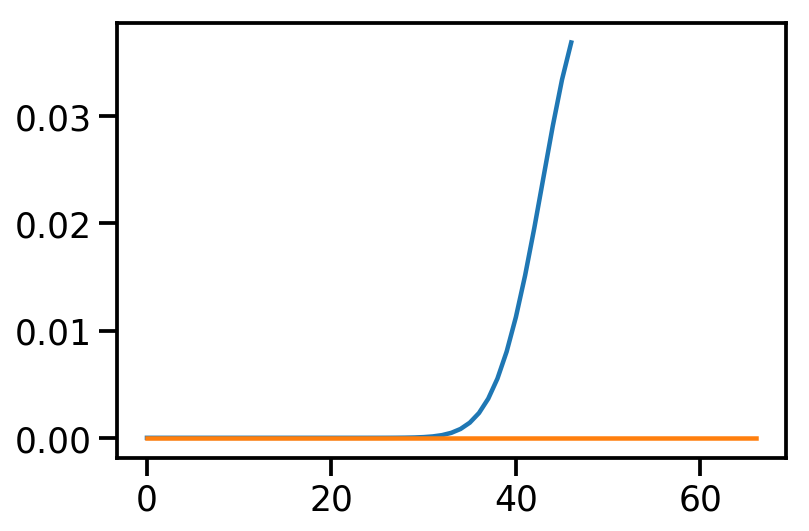

In [415]:
before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

plt.plot(before_gaussian)
plt.plot(after_gaussian)

In [521]:
from ipywidgets import interact
# fix movement state transition
from scipy.stats import multivariate_normal

position = position_info.linear_position2.values
place_bin_edges = replay_detector.place_bin_edges_.squeeze()
place_bin_centers = replay_detector.place_bin_centers_.squeeze()
labels = position_info.arm_name.values
movement_var = replay_detector.movement_std
replay_speed = 200

bin_inds = np.digitize(position, bins=place_bin_edges) - 1
bin_labels = pd.Series(labels).groupby(bin_inds).unique().apply(lambda s: s[0])
n_bins = place_bin_edges.size - 1

@interact(bin_ind=(0, place_bin_centers.size-1))
def plot_bin(bin_ind=0):
    bin_center = place_bin_centers[bin_ind]
    row = np.zeros((n_bins,))
    try:
        bin_label = bin_labels.loc[bin_ind]
        is_same_bin = (bin_labels == bin_label)
        is_same_bin_ind = is_same_bin[is_same_bin].index
        is_same_bin = np.zeros_like(place_bin_centers.squeeze(), dtype=np.bool)
        is_same_bin[is_same_bin_ind] = True

        gaussian = multivariate_normal(mean=bin_center, cov=movement_var * replay_speed).pdf(
            place_bin_centers)
        row[is_same_bin] = gaussian[is_same_bin]
        before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
        after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]

        if bin_label == 'Center Arm':
            arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
            n_samples = min(arm_ind.size, after_gaussian.size)
            row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2

            arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
            n_samples = min(arm_ind.size, after_gaussian.size)
            row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2
        elif bin_label == 'Left Arm':
            arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
            n_samples = min(arm_ind.size, before_gaussian.size)
            row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

            arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
            n_samples = min(arm_ind.size, before_gaussian.size)
            row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2
        elif bin_label == 'Right Arm':
            arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
            n_samples = min(arm_ind.size, before_gaussian.size)
            row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

            arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
            n_samples = min(arm_ind.size, before_gaussian.size)
            row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2
    except KeyError:
        pass
    row /= row.sum()
    plt.figure(figsize=(15,3))

    for arm_name, max_position in max_df.iteritems():
        plt.axvline(max_position, color='lightgrey',
                   linestyle='-', linewidth=1, zorder=0)
    min_df = (position_info
              .groupby('arm_name')[position_metric].min())
    for arm_name, min_position in min_df.iteritems():
        plt.axvline(min_position, color='lightgrey',
                   linestyle='-', linewidth=1, zorder=0)
        plt.text(min_position, 1.01, arm_name)

    row2 = replay_detector.movement_state_transition_[bin_ind] 
    plt.plot(place_bin_centers, row2, label='empirical', linewidth=3)
    plt.plot(place_bin_centers, row, label='random walk', linewidth=3)
    plt.ylim((0, 1))
    plt.legend()
    sns.despine()

interactive(children=(IntSlider(value=0, description='bin_ind', max=167), Output()), _dom_classes=('widget-int…

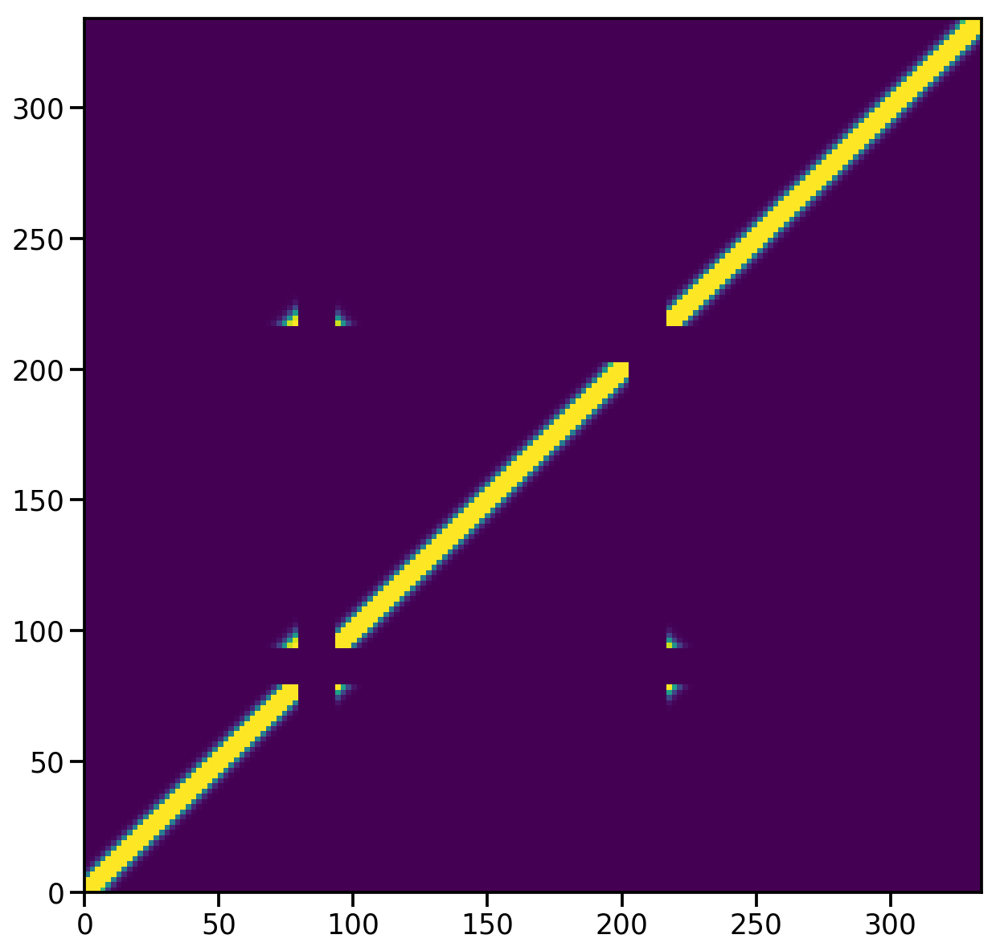

In [541]:
from replay_identification.movement_state_transition import _normalize_row_probability

def _center_arm(row, bin_labels, before_gaussian, after_gaussian):
    arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
    n_samples = min(arm_ind.size, after_gaussian.size)
    row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2

    arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
    n_samples = min(arm_ind.size, after_gaussian.size)
    row[arm_ind[:n_samples]] = after_gaussian[:n_samples] / 2
    return row


def _left_arm(row, bin_labels, before_gaussian, after_gaussian):
    arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
    n_samples = min(arm_ind.size, before_gaussian.size)
    row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

    arm_ind = bin_labels.loc[(bin_labels == 'Right Arm')].index
    n_samples = min(arm_ind.size, before_gaussian.size)
    row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2
    return row


def _right_arm(row, bin_labels, before_gaussian, after_gaussian):
    arm_ind = bin_labels.loc[(bin_labels == 'Center Arm')].index
    n_samples = min(arm_ind.size, before_gaussian.size)
    row[arm_ind[-n_samples:]] = before_gaussian[-n_samples:] / 2

    arm_ind = bin_labels.loc[(bin_labels == 'Left Arm')].index
    n_samples = min(arm_ind.size, before_gaussian.size)
    row[arm_ind[:n_samples]] = before_gaussian[-n_samples:][::-1] / 2
    return row


_ARM_FUNCS = {
    'Left Arm': _left_arm,
    'Right Arm': _right_arm,
    'Center Arm': _center_arm,
}


def w_track_1D_random_walk(position, place_bin_edges, place_bin_centers,
                           labels, movement_var, replay_speed=200):
    position = position.squeeze()
    place_bin_edges = place_bin_edges.squeeze()
    place_bin_centers = place_bin_centers.squeeze()
    bin_inds = np.digitize(position, bins=place_bin_edges) - 1
    bin_labels = pd.Series(labels).groupby(
        bin_inds).unique().apply(lambda s: s[0])
    n_bins = place_bin_edges.size - 1
    transition_matrix = []

    for bin_ind in np.arange(n_bins):
        bin_center = place_bin_centers[bin_ind]
        row = np.zeros((n_bins,))
        try:
            bin_label = bin_labels.loc[bin_ind]
            is_same_bin = (bin_labels == bin_label)
            is_same_bin_ind = is_same_bin[is_same_bin].index
            is_same_bin = np.zeros_like(
                place_bin_centers.squeeze(), dtype=np.bool)
            is_same_bin[is_same_bin_ind] = True

            gaussian = multivariate_normal(
                mean=bin_center, cov=movement_var * replay_speed).pdf(
                place_bin_centers)
            row[is_same_bin] = gaussian[is_same_bin]
            before_gaussian = gaussian[:np.nonzero(is_same_bin)[0][0]]
            after_gaussian = gaussian[np.nonzero(is_same_bin)[0][-1]:]
            row = _ARM_FUNCS[bin_label](row, bin_labels, before_gaussian,
                                        after_gaussian)
        except KeyError:
            row = np.zeros((n_bins,))
        transition_matrix.append(row)

    transition_matrix = np.stack(transition_matrix, axis=1)
    return _normalize_row_probability(transition_matrix)
    
st = w_track_1D_random_walk(position, place_bin_edges, place_bin_centers,
                           labels, movement_var, replay_speed=200)
plt.figure(figsize=(10, 10))
plt.pcolormesh(place_bin_edges.squeeze(), place_bin_edges.squeeze(), st, vmax=0.1)

In [542]:
@interact(bin_ind=(0, place_bin_centers.size-1))
def plot_st(bin_ind=0):
    plt.figure(figsize=(15,3))

    for arm_name, max_position in max_df.iteritems():
        plt.axvline(max_position, color='lightgrey',
                   linestyle='-', linewidth=1, zorder=0)
    min_df = (position_info
              .groupby('arm_name')[position_metric].min())
    for arm_name, min_position in min_df.iteritems():
        plt.axvline(min_position, color='lightgrey',
                   linestyle='-', linewidth=1, zorder=0)
        plt.text(min_position, 1.01, arm_name)
    st = w_track_1D_random_walk(position, place_bin_edges, place_bin_centers,
                               labels, movement_var, replay_speed=200)
    row = st[bin_ind]
    row2 = replay_detector.movement_state_transition_[bin_ind] 
    plt.plot(place_bin_centers, row2, label='empirical', linewidth=3)
    plt.plot(place_bin_centers, row, label='random walk', linewidth=3)
    plt.ylim((-0.1, 1))
    plt.legend()
    sns.despine()

interactive(children=(IntSlider(value=0, description='bin_ind', max=167), Output()), _dom_classes=('widget-int…

In [588]:
st = w_track_1D_random_walk(position, place_bin_edges, place_bin_centers,
                           labels, movement_var, replay_speed=100)
replay_detector.movement_state_transition_ = st

In [ ]:
detector_results = replay_detector.predict(
    speed=data['position_info'][speed_metric],
    position=data['position_info'][position_metric],
    lfp_power=data['power'],
    spikes=data['spikes'],
    time=data['position_info'].index,
    use_likelihoods=['spikes'],
    use_smoother=True)

INFO:replay_identification.decoders:Predicting spikes likelihood...


INFO:replay_identification.decoders:Predicting replay probability and density...
INFO:replay_identification.decoders:Smoothing...


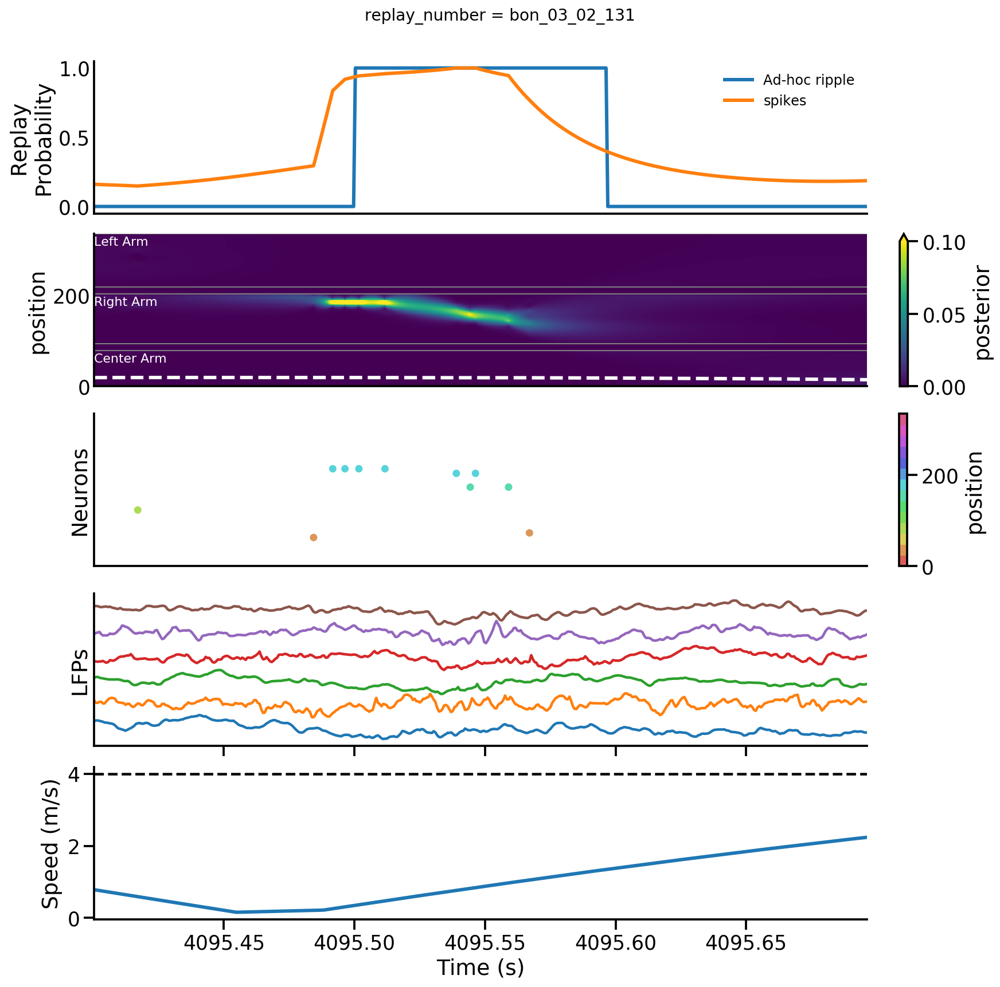

In [559]:
replay_number = 131

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes', 'speed'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(0.100, 's'));

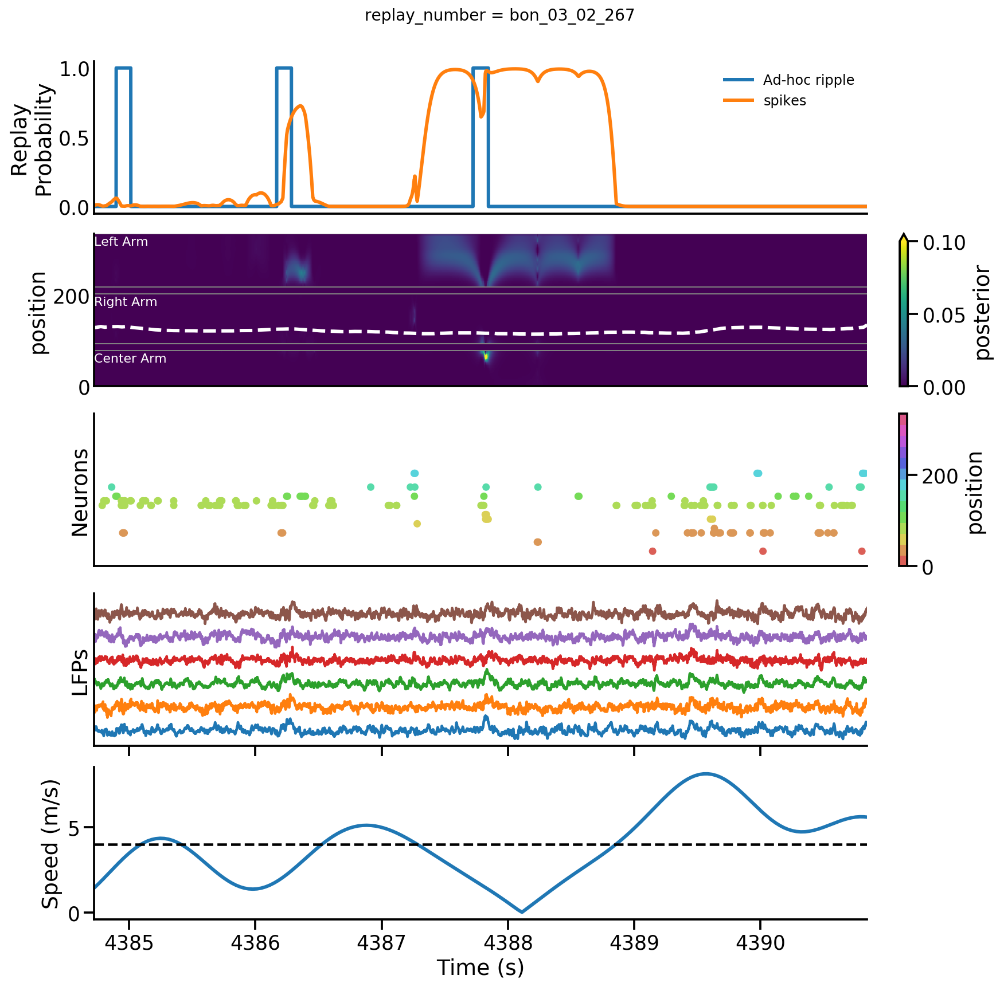

In [584]:
replay_number = 267

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes', 'speed'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(3.000, 's'));

In [ ]:
replay_number = 267

plot_replay_with_data(replay_number, data, data['ripple_times'], epoch_key,
                      replay_detector, spikes_detector_results=detector_results,
                      show_data_types=['lfps', 'spikes', 'speed'],
                      show_result_types=['ad_hoc_ripple', 'spikes'],
                      position_metric=position_metric, offset=pd.Timedelta(1.250, 's'));